In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

#!/usr/bin/env python3

seed_value=42

import os
import sys
import random as rn

from fastai.vision import *
from fastai.metrics import error_rate

import shutil

# -----------------------------
#from google.colab import drive
#from os import walk

#drive.mount('/content/gdrive')
# -----------------------------


# -----------------------------
# Make everything deterministic
os.environ['PYTHONHASHSEED']=str(seed_value)
np.random.seed(seed_value)
rn.seed(seed_value)

import torch

torch.manual_seed(seed_value)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
# -----------------------------

from subprocess import check_output
nvidia_smi_ = [0, 0]

def nvidia_smi(nvidia_smi_):
    old_nvidia_smi_ = nvidia_smi_[1]
    nvidia_smi_now  = int(check_output(['nvidia-smi', '--query-gpu=memory.used', '--format=csv,nounits,noheader']))
    nvidia_smi_[0]  = nvidia_smi_now
    nvidia_smi_[1]  = nvidia_smi_now - old_nvidia_smi_
    return nvidia_smi_ 

print('nvidia-smi memory usage/increment:', nvidia_smi(nvidia_smi_))

torch.cuda.empty_cache()

from datetime import datetime
currtime = datetime.now().strftime('%Y-%m-%d_%H.%M.%S')

caddy_gestures_dataset_dir   = 'all-scenarios-split-cristal-clear-vs-cloudy-and-dark'
caddy_gestures_dataset_fname = caddy_gestures_dataset_dir + '.zip'
caddy_gestures_dataset_url   = 'http://caddy-underwater-datasets.ge.issia.cnr.it/assets/caddy-gestures-TMP/' + caddy_gestures_dataset_fname

nvidia-smi memory usage/increment: [413, 413]


In [3]:
!wget "$caddy_gestures_dataset_url"

--2019-12-09 13:59:44--  http://caddy-underwater-datasets.ge.issia.cnr.it/assets/caddy-gestures-TMP/all-scenarios-split-cristal-clear-vs-cloudy-and-dark.zip
Resolving caddy-underwater-datasets.ge.issia.cnr.it (caddy-underwater-datasets.ge.issia.cnr.it)... 150.145.4.194
Connecting to caddy-underwater-datasets.ge.issia.cnr.it (caddy-underwater-datasets.ge.issia.cnr.it)|150.145.4.194|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1540347170 (1.4G) [application/zip]
Saving to: ‘all-scenarios-split-cristal-clear-vs-cloudy-and-dark.zip’

all-scenarios-split 100%[===================>]   1.43G  11.2MB/s    in 2m 17s  

2019-12-09 14:02:00 (10.8 MB/s) - ‘all-scenarios-split-cristal-clear-vs-cloudy-and-dark.zip’ saved [1540347170/1540347170]



In [2]:
!md5sum "$caddy_gestures_dataset_fname"
print('88dd6fbfc8176d6845dd0f55f95c0c5b  all-scenarios-split-cristal-clear-vs-cloudy-and-dark.zip')

88dd6fbfc8176d6845dd0f55f95c0c5b  all-scenarios-split-cristal-clear-vs-cloudy-and-dark.zip
88dd6fbfc8176d6845dd0f55f95c0c5b  all-scenarios-split-cristal-clear-vs-cloudy-and-dark.zip


In [5]:
!unzip "$caddy_gestures_dataset_fname"
!ls

Archive:  all-scenarios-split-cristal-clear-vs-cloudy-and-dark.zip
   creating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/
   creating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/
   creating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/
   creating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/crystal-clear/
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/crystal-clear/backwards___biograd-A_00404_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/crystal-clear/backwards___biograd-A_00404_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/crystal-clear/backwards___biograd-A_00405_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/crystal-clear/backwards___biograd-A_00405_right.jpg  
  inflating: al

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/crystal-clear/backwards___genova-A_00197_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/crystal-clear/backwards___genova-A_00197_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/crystal-clear/backwards___genova-A_00198_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/crystal-clear/backwards___genova-A_00198_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/crystal-clear/backwards___genova-A_00199_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/crystal-clear/backwards___genova-A_00199_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/crystal-clear/backwards___genova-A_00200_left.jpg  
  i

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/crystal-clear/backwards___genova-A_00416_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/crystal-clear/backwards___genova-A_00416_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/crystal-clear/backwards___genova-A_00417_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/crystal-clear/backwards___genova-A_00417_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/crystal-clear/backwards___genova-A_00418_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/crystal-clear/backwards___genova-A_00418_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/crystal-clear/backwards___genova-A_00593_left.jpg  
  i

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/crystal-clear/backwards___genova-A_00822_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/crystal-clear/backwards___genova-A_00822_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/crystal-clear/backwards___genova-A_00881_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/crystal-clear/backwards___genova-A_00881_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/crystal-clear/backwards___genova-A_00882_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/crystal-clear/backwards___genova-A_00882_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/crystal-clear/backwards___genova-A_00883_left.jpg  
  i

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/crystal-clear/backwards___genova-A_02147_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/crystal-clear/backwards___genova-A_02147_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/crystal-clear/backwards___genova-A_02148_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/crystal-clear/backwards___genova-A_02148_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/crystal-clear/backwards___genova-A_02149_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/crystal-clear/backwards___genova-A_02149_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/crystal-clear/backwards___genova-A_02150_left.jpg  
  i

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_00024_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_00025_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_00025_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_00026_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_00026_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_00027_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_00072_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_00073_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_00073_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_00074_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_00074_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_00075_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_00114_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_00114_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_00115_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_00115_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_00116_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_00116_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_01057_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_01058_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_01058_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_01059_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_01059_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_01060_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_01337_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_01337_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_01338_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_01338_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_01339_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_01339_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_01381_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_01382_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_01382_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_01383_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_01383_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_01384_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_01564_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_01565_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_01565_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_01566_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_01566_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_01567_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_01610_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_01611_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_01611_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_01612_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_01612_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_01613_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/crystal-clear/boat___biograd-B_00606_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/crystal-clear/boat___biograd-B_00606_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/crystal-clear/boat___biograd-B_00607_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/crystal-clear/boat___biograd-B_00607_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/crystal-clear/boat___biograd-B_00608_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/crystal-clear/boat___biograd-B_00608_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/crystal-clear/boat___biograd-B_00609_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/crystal-clear/boat___genova-A_01891_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/crystal-clear/boat___genova-A_01892_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/crystal-clear/boat___genova-A_01892_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/crystal-clear/boat___genova-A_01893_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/crystal-clear/boat___genova-A_01893_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/crystal-clear/boat___genova-A_01894_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/crystal-clear/boat___genova-A_01894_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-sc

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/crystal-clear/boat___genova-A_02510_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/crystal-clear/boat___genova-A_02510_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/crystal-clear/boat___genova-A_02511_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/crystal-clear/boat___genova-A_02511_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/crystal-clear/boat___genova-A_02581_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/crystal-clear/boat___genova-A_02581_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/crystal-clear/boat___genova-A_02582_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-sce

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/crystal-clear/boat___genova-A_02727_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/crystal-clear/boat___genova-A_02727_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/crystal-clear/boat___genova-A_02728_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/crystal-clear/boat___genova-A_02728_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/crystal-clear/boat___genova-A_02729_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/crystal-clear/boat___genova-A_02729_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/crystal-clear/boat___genova-A_02730_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-sce

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/cloudy-and-dark/boat___biograd-C_01114_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/cloudy-and-dark/boat___biograd-C_01115_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/cloudy-and-dark/boat___biograd-C_01115_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/cloudy-and-dark/boat___biograd-C_01116_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/cloudy-and-dark/boat___biograd-C_01116_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/cloudy-and-dark/boat___biograd-C_01117_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/cloudy-and-dark/boat___biograd-C_01117_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-c

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/cloudy-and-dark/boat___brodarski-C_00391_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/cloudy-and-dark/boat___brodarski-C_00392_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/cloudy-and-dark/boat___brodarski-C_00392_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/cloudy-and-dark/boat___brodarski-C_00393_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/cloudy-and-dark/boat___brodarski-C_00393_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/cloudy-and-dark/boat___brodarski-C_00394_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/cloudy-and-dark/boat___brodarski-C_00394_right.jpg  
  inflating: all-scenarios-split-cris

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/cloudy-and-dark/boat___brodarski-C_00608_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/cloudy-and-dark/boat___brodarski-C_00608_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/cloudy-and-dark/boat___brodarski-C_00609_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/cloudy-and-dark/boat___brodarski-C_00609_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/cloudy-and-dark/boat___brodarski-C_00610_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/cloudy-and-dark/boat___brodarski-C_00610_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/cloudy-and-dark/boat___brodarski-C_00611_left.jpg  
  inflating: all-scenarios-split-crist

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/cloudy-and-dark/boat___brodarski-D_00197_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/cloudy-and-dark/boat___brodarski-D_00197_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/cloudy-and-dark/boat___brodarski-D_00198_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/cloudy-and-dark/boat___brodarski-D_00198_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/cloudy-and-dark/boat___brodarski-D_00199_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/cloudy-and-dark/boat___brodarski-D_00199_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/cloudy-and-dark/boat___brodarski-D_00200_left.jpg  
  inflating: all-scenarios-split-crist

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___biograd-A_01159_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___biograd-A_01159_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___biograd-A_01160_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___biograd-A_01160_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___biograd-B_00616_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___biograd-B_00616_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___biograd-B_00617_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cl

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___biograd-B_00787_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___biograd-B_00787_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___biograd-B_00788_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___biograd-B_00788_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_00076_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_00076_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_00077_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloud

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_00220_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_00220_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_00221_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_00221_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_00222_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_00222_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_00223_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-an

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_00541_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_00541_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_00542_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_00542_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_00543_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_00543_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_00544_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-an

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_00787_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_00787_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_00829_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_00829_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_00830_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_00830_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_00831_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-an

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_01130_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_01130_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_01131_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_01131_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_01132_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_01132_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_01133_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-an

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_02416_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_02417_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_02417_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_02418_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_02418_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_02419_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_02419_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-a

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_02544_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_02545_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_02545_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_02546_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_02546_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_02547_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_02547_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-a

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_02742_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_02743_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_02743_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_02744_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_02744_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_02745_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_02745_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-a

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_03210_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_03211_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_03211_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_03212_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_03212_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_03213_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/crystal-clear/carry___genova-A_03213_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-a

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___brodarski-A_00154_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___brodarski-A_00155_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___brodarski-A_00155_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___brodarski-A_00156_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___brodarski-A_00156_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___brodarski-A_00157_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___brodarski-A_00157_right.jpg  
  inflating: all-scenar

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___brodarski-C_00664_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___brodarski-C_00665_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___brodarski-C_00665_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___brodarski-C_00666_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___brodarski-C_00666_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___brodarski-C_00667_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___brodarski-C_00667_right.jpg  
  inflating: all-scenar

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___biograd-C_00175_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___biograd-C_00176_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___biograd-C_00176_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___biograd-C_00177_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___biograd-C_00177_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___biograd-C_00178_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___biograd-C_00178_right.jpg  
  inflating: all-scenarios-split-cris

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___biograd-C_00207_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___biograd-C_00207_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___biograd-C_00208_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___biograd-C_00208_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___biograd-C_00209_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___biograd-C_00209_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___biograd-C_00210_left.jpg  
  inflating: all-scenarios-split-crist

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___biograd-C_00706_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___biograd-C_00707_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___biograd-C_00707_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___biograd-C_00708_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___biograd-C_00708_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___biograd-C_00709_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___biograd-C_00709_right.jpg  
  inflating: all-scenarios-split-cris

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___biograd-C_01410_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___biograd-C_01410_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___biograd-C_01411_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___biograd-C_01411_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___biograd-C_01412_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___biograd-C_01412_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___biograd-C_01413_left.jpg  
  inflating: all-scenarios-split-crist

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___biograd-C_01658_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___biograd-C_01658_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___biograd-C_01659_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___biograd-C_01659_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___biograd-C_01660_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___biograd-C_01660_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___biograd-C_01661_left.jpg  
  inflating: all-scenarios-split-crist

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___biograd-A_00339_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___biograd-A_00340_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___biograd-A_00340_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___biograd-A_00360_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___biograd-A_00360_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___biograd-A_00361_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___biograd-A_00361_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_00167_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_00168_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_00168_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_00169_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_00169_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_00170_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_00170_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-sc

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_00347_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_00347_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_00348_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_00348_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_00349_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_00349_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_00350_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-sce

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_00813_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_00814_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_00814_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_00823_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_00823_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_00824_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_00824_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-sc

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_00959_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_00959_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_00960_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_00960_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_00961_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_00961_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_00962_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-sce

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_01059_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_01060_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_01060_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_01061_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_01061_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_01062_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_01062_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-sc

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_01947_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_01947_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_01948_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_01948_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_01949_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_01949_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_01950_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-sce

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_02007_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_02008_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_02008_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_02009_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_02009_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_02010_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_02010_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-sc

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_02984_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_02984_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_02985_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_02985_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_02986_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_02986_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_02987_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-sce

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_03111_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_03111_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_03120_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_03120_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_03121_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_03121_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_03122_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-sce

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/cloudy-and-dark/down___biograd-C_01286_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/cloudy-and-dark/down___biograd-C_01286_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/cloudy-and-dark/down___biograd-C_01287_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/cloudy-and-dark/down___biograd-C_01287_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/cloudy-and-dark/down___biograd-C_01288_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/cloudy-and-dark/down___biograd-C_01288_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/cloudy-and-dark/down___biograd-C_01289_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cl

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_00029_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_00029_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_00030_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_00030_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_00031_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_00031_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_00032_left.jpg  
  inflatin

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_00327_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_00328_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_00328_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_00329_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_00329_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_00330_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_00330_right.jpg  
  inflati

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_00536_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_00537_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_00537_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_00538_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_00538_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_00539_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_00539_right.jpg  
  inflati

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_00805_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_00806_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_00806_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_00807_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_00807_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_00808_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_00808_right.jpg  
  inflati

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01048_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01049_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01049_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01050_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01050_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01051_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01051_right.jpg  
  inflati

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01271_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01271_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01272_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01272_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01273_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01273_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01274_left.jpg  
  inflatin

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01405_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01406_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01406_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01407_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01407_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01408_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01408_right.jpg  
  inflati

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01484_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01484_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01485_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01485_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01486_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01486_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01487_left.jpg  
  inflatin

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01558_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01558_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01559_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01559_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01560_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01560_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01561_left.jpg  
  inflatin

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01625_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01625_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01626_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01626_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01627_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01627_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01628_left.jpg  
  inflatin

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01690_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01690_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01691_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01691_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01692_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01692_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-A_01693_left.jpg  
  inflatin

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-B_00189_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-B_00190_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-B_00190_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-B_00191_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-B_00191_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-B_00192_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-B_00192_right.jpg  
  inflati

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-B_00405_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-B_00405_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-B_00406_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-B_00406_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-B_00407_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-B_00407_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-B_00422_left.jpg  
  inflatin

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-B_00566_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-B_00566_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-B_00592_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-B_00592_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-B_00593_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-B_00593_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-B_00594_left.jpg  
  inflatin

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-B_00799_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-B_00800_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-B_00800_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-B_00815_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-B_00815_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-B_00816_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-B_00816_right.jpg  
  inflati

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-B_00911_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-B_00911_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-B_00912_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-B_00912_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-B_00913_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-B_00913_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___biograd-B_00918_left.jpg  
  inflatin

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___genova-A_00655_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___genova-A_00655_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___genova-A_00656_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___genova-A_00656_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___genova-A_00665_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___genova-A_00665_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___genova-A_00676_left.jpg  
  inflating: all-

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___genova-A_01480_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___genova-A_01481_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___genova-A_01481_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___genova-A_01482_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___genova-A_01482_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___genova-A_01483_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___genova-A_01483_right.jpg  
  inflating: all

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___genova-A_01823_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___genova-A_01823_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___genova-A_01824_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___genova-A_01824_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___genova-A_01825_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___genova-A_01825_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___genova-A_01826_left.jpg  
  inflating: all-

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___genova-A_02191_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___genova-A_02192_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___genova-A_02192_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___genova-A_02193_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___genova-A_02193_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___genova-A_02194_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___genova-A_02194_right.jpg  
  inflating: all

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___genova-A_02557_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___genova-A_02558_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___genova-A_02558_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___genova-A_02559_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___genova-A_02559_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___genova-A_02560_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___genova-A_02560_right.jpg  
  inflating: all

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___genova-A_03262_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___genova-A_03262_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___genova-A_03263_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___genova-A_03263_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___genova-A_03288_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___genova-A_03288_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/crystal-clear/end_comm___genova-A_03289_left.jpg  
  inflating: all-

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-A_00080_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-A_00081_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-A_00081_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-A_00082_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-A_00082_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-A_00083_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-A

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-C_00190_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-C_00191_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-C_00191_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-C_00192_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-C_00192_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-C_00193_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-C

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-C_00366_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-C_00367_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-C_00367_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-C_00368_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-C_00368_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-C_00369_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-C

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-C_00536_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-C_00537_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-C_00537_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-C_00538_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-C_00538_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-C_00539_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-C

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-C_00745_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-C_00745_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-C_00746_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-C_00746_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-C_00747_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-C_00747_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-C

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-D_00287_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-D_00287_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-D_00288_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-D_00288_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-D_00289_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-D_00289_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-D

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-D_00317_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-D_00318_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-D_00318_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-D_00319_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-D_00319_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-D_00320_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___brodarski-D

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___biograd-C_00624_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___biograd-C_00624_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___biograd-C_00625_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___biograd-C_00625_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___biograd-C_00626_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___biograd-C_00626_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___biograd-C_00627_left.jp

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___biograd-C_00910_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___biograd-C_00911_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___biograd-C_00911_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___biograd-C_00912_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___biograd-C_00912_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___biograd-C_00913_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___biograd-C_00913_right.j

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___biograd-C_01174_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___biograd-C_01174_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___biograd-C_01175_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___biograd-C_01175_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___biograd-C_01176_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___biograd-C_01176_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___biograd-C_01177_left.jp

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/five/crystal-clear/five___biograd-A_00211_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/five/crystal-clear/five___biograd-A_00212_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/five/crystal-clear/five___biograd-A_00212_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/five/crystal-clear/five___biograd-A_00213_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/five/crystal-clear/five___biograd-A_00213_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/five/crystal-clear/five___biograd-A_00214_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/five/crystal-clear/five___biograd-A_00214_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/crystal-clear/four___biograd-A_00195_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/crystal-clear/four___biograd-A_00196_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/crystal-clear/four___biograd-A_00196_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/crystal-clear/four___biograd-A_00197_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/crystal-clear/four___biograd-A_00197_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/crystal-clear/four___biograd-A_00551_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/crystal-clear/four___biograd-A_00551_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/crystal-clear/four___biograd-A_00723_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/crystal-clear/four___biograd-A_00724_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/crystal-clear/four___biograd-A_00724_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/crystal-clear/four___biograd-A_00725_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/crystal-clear/four___biograd-A_00725_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/crystal-clear/four___biograd-A_00726_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/crystal-clear/four___biograd-A_00726_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/crystal-clear/four___biograd-B_00082_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/crystal-clear/four___biograd-B_00083_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/crystal-clear/four___biograd-B_00083_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/crystal-clear/four___biograd-B_00084_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/crystal-clear/four___biograd-B_00084_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/crystal-clear/four___biograd-B_00085_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/crystal-clear/four___biograd-B_00085_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/crystal-clear/four___genova-A_01307_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/crystal-clear/four___genova-A_01308_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/crystal-clear/four___genova-A_01308_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/crystal-clear/four___genova-A_01309_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/crystal-clear/four___genova-A_01309_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/crystal-clear/four___genova-A_01310_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/crystal-clear/four___genova-A_01310_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-sc

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/crystal-clear/four___genova-A_02220_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/crystal-clear/four___genova-A_02221_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/crystal-clear/four___genova-A_02221_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/crystal-clear/four___genova-A_02222_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/crystal-clear/four___genova-A_02222_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/crystal-clear/four___genova-A_02223_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/crystal-clear/four___genova-A_02223_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-sc

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/cloudy-and-dark/four___biograd-C_01071_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/cloudy-and-dark/four___biograd-C_01071_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/cloudy-and-dark/four___biograd-C_01072_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/cloudy-and-dark/four___biograd-C_01072_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/cloudy-and-dark/four___biograd-C_01073_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/cloudy-and-dark/four___biograd-C_01073_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/cloudy-and-dark/four___biograd-C_01074_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cl

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/here/crystal-clear/here___biograd-A_01174_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/here/crystal-clear/here___biograd-A_01174_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/here/crystal-clear/here___biograd-A_01175_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/here/crystal-clear/here___biograd-A_01175_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/here/crystal-clear/here___biograd-A_01176_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/here/crystal-clear/here___biograd-A_01176_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/here/crystal-clear/here___biograd-A_01177_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/here/crystal-clear/here___biograd-A_01314_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/here/crystal-clear/here___biograd-A_01315_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/here/crystal-clear/here___biograd-A_01315_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/here/crystal-clear/here___biograd-B_00626_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/here/crystal-clear/here___biograd-B_00626_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/here/crystal-clear/here___biograd-B_00627_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/here/crystal-clear/here___biograd-B_00627_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/here/crystal-clear/here___genova-A_00791_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/here/crystal-clear/here___genova-A_00791_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/here/crystal-clear/here___genova-A_01626_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/here/crystal-clear/here___genova-A_01626_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/here/crystal-clear/here___genova-A_01627_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/here/crystal-clear/here___genova-A_01627_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/here/crystal-clear/here___genova-A_01628_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-sce

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/here/cloudy-and-dark/here___brodarski-A_00189_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/here/cloudy-and-dark/here___brodarski-A_00189_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/here/cloudy-and-dark/here___brodarski-A_00190_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/here/cloudy-and-dark/here___brodarski-A_00190_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/here/cloudy-and-dark/here___brodarski-A_00191_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/here/cloudy-and-dark/here___brodarski-A_00191_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/here/cloudy-and-dark/here___brodarski-A_00192_left.jpg  
  inflating: all-scenarios-split-crist

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/here/cloudy-and-dark/here___brodarski-C_00725_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/here/cloudy-and-dark/here___brodarski-C_00725_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/here/cloudy-and-dark/here___brodarski-C_00726_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/here/cloudy-and-dark/here___brodarski-C_00726_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/here/cloudy-and-dark/here___brodarski-C_00727_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/here/cloudy-and-dark/here___brodarski-C_00727_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/here/cloudy-and-dark/here___brodarski-C_00728_left.jpg  
  inflating: all-scenarios-split-crist

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/here/cloudy-and-dark/here___biograd-C_01216_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/here/cloudy-and-dark/here___biograd-C_01216_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/here/cloudy-and-dark/here___biograd-C_01217_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/here/cloudy-and-dark/here___biograd-C_01217_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/here/cloudy-and-dark/here___biograd-C_01218_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/here/cloudy-and-dark/here___biograd-C_01218_right.jpg  
   creating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/mosaic/
   creating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/mosaic/crystal-clea

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/mosaic/crystal-clear/mosaic___biograd-A_00830_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/mosaic/crystal-clear/mosaic___biograd-A_00830_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/mosaic/crystal-clear/mosaic___biograd-A_00831_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/mosaic/crystal-clear/mosaic___biograd-A_00831_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/mosaic/crystal-clear/mosaic___biograd-A_00832_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/mosaic/crystal-clear/mosaic___biograd-A_00832_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/mosaic/crystal-clear/mosaic___biograd-A_00833_left.jpg  
  inflating: all-scenarios-split-crist

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/mosaic/crystal-clear/mosaic___biograd-B_00545_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/mosaic/crystal-clear/mosaic___biograd-B_00546_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/mosaic/crystal-clear/mosaic___biograd-B_00546_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/mosaic/crystal-clear/mosaic___biograd-B_00547_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/mosaic/crystal-clear/mosaic___biograd-B_00547_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/mosaic/crystal-clear/mosaic___biograd-B_00548_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/mosaic/crystal-clear/mosaic___biograd-B_00548_right.jpg  
  inflating: all-scenarios-split-cris

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/mosaic/crystal-clear/mosaic___genova-A_02785_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/mosaic/crystal-clear/mosaic___genova-A_02785_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/mosaic/crystal-clear/mosaic___genova-A_02786_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/mosaic/crystal-clear/mosaic___genova-A_02786_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/mosaic/crystal-clear/mosaic___genova-A_02787_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/mosaic/crystal-clear/mosaic___genova-A_02787_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/mosaic/crystal-clear/mosaic___genova-A_02788_left.jpg  
  inflating: all-scenarios-split-cristal-clea

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/mosaic/cloudy-and-dark/mosaic___brodarski-B_00062_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/mosaic/cloudy-and-dark/mosaic___brodarski-B_00062_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/mosaic/cloudy-and-dark/mosaic___brodarski-B_00063_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/mosaic/cloudy-and-dark/mosaic___brodarski-B_00063_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/mosaic/cloudy-and-dark/mosaic___brodarski-B_00064_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/mosaic/cloudy-and-dark/mosaic___brodarski-B_00064_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/mosaic/cloudy-and-dark/mosaic___brodarski-B_00065_left.jpg  
  inflatin

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/mosaic/cloudy-and-dark/mosaic___brodarski-D_00024_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/mosaic/cloudy-and-dark/mosaic___brodarski-D_00024_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/mosaic/cloudy-and-dark/mosaic___brodarski-D_00025_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/mosaic/cloudy-and-dark/mosaic___brodarski-D_00025_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/mosaic/cloudy-and-dark/mosaic___brodarski-D_00026_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/mosaic/cloudy-and-dark/mosaic___brodarski-D_00026_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/mosaic/cloudy-and-dark/mosaic___brodarski-D_00027_left.jpg  
  inflatin

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00020_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00020_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00021_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00021_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00022_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00022_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimit

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00103_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00113_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00113_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00114_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00114_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00115_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimit

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00204_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00204_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00205_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00205_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00215_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00215_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimit

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00379_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00380_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00380_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00381_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00381_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00382_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimit

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00568_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00569_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00569_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00592_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00592_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00593_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimit

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00714_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00715_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00715_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00716_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00716_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00717_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimit

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00797_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00798_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00798_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00799_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00799_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00800_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimit

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00961_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00961_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00962_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00962_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00974_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00974_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimit

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-B_00054_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-B_00055_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-B_00055_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-B_00056_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-B_00056_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-B_00057_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimit

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-B_00172_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-B_00173_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-B_00173_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-B_00177_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-B_00177_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-B_00178_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimit

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-B_00233_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-B_00236_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-B_00236_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-B_00237_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-B_00237_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-B_00238_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimit

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-B_00385_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-B_00385_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-B_00400_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-B_00400_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-B_00401_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-B_00401_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimit

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-B_00555_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-B_00555_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-B_00556_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-B_00556_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-B_00557_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-B_00557_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimit

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___genova-A_00753_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___genova-A_00754_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___genova-A_00754_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___genova-A_00760_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___genova-A_00760_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___genova-A_00761_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cry

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___genova-A_01355_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___genova-A_01355_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___genova-A_01356_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___genova-A_01356_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___genova-A_01421_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___genova-A_01421_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cry

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___genova-A_01777_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___genova-A_01778_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___genova-A_01778_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___genova-A_01779_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___genova-A_01779_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___genova-A_01780_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cry

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___genova-A_02071_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___genova-A_02071_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___genova-A_02072_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___genova-A_02072_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___genova-A_02073_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___genova-A_02073_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cry

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___genova-A_02169_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___genova-A_02170_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___genova-A_02170_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___genova-A_02171_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___genova-A_02171_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___genova-A_02172_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cry

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___genova-A_02244_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___genova-A_02245_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___genova-A_02245_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___genova-A_02246_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___genova-A_02246_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___genova-A_02247_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cry

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___genova-A_02348_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___genova-A_02349_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___genova-A_02349_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___genova-A_02350_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___genova-A_02350_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___genova-A_02351_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cry

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___brodarski-A_00087_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___brodarski-A_00149_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___brodarski-A_00149_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___brodarski-A_00150_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___brodarski-A_00150_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___brodarski-A_00151_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/a

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___brodarski-C_00179_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___brodarski-C_00179_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___brodarski-C_00180_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___brodarski-C_00180_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___brodarski-C_00181_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___brodarski-C_00181_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/a

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___brodarski-C_00332_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___brodarski-C_00332_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___brodarski-C_00333_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___brodarski-C_00333_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___brodarski-C_00334_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___brodarski-C_00334_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/a

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___brodarski-D_00083_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___brodarski-D_00105_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___brodarski-D_00105_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___brodarski-D_00106_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___brodarski-D_00106_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___brodarski-D_00107_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/a

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___biograd-C_00401_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___biograd-C_00402_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___biograd-C_00402_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___biograd-C_00403_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___biograd-C_00403_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___biograd-C_00404_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___biograd-C_00602_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___biograd-C_00602_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___biograd-C_00603_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___biograd-C_00603_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___biograd-C_00604_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___biograd-C_00604_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___biograd-C_00879_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___biograd-C_00879_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___biograd-C_00880_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___biograd-C_00880_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___biograd-C_00881_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___biograd-C_00881_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___biograd-C_01024_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___biograd-C_01024_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___biograd-C_01025_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___biograd-C_01025_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___biograd-C_01026_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/cloudy-and-dark/num_delimiter___biograd-C_01026_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/one/crystal-clear/one___biograd-B_00007_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/one/crystal-clear/one___biograd-B_00007_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/one/crystal-clear/one___biograd-B_00024_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/one/crystal-clear/one___biograd-B_00024_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/one/crystal-clear/one___biograd-B_00025_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/one/crystal-clear/one___biograd-B_00025_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/one/crystal-clear/one___biograd-B_00026_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/one/crystal-clear/one___biograd-B_00380_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/one/crystal-clear/one___biograd-B_00380_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/one/crystal-clear/one___biograd-B_00381_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/one/crystal-clear/one___biograd-B_00381_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/one/crystal-clear/one___biograd-B_00429_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/one/crystal-clear/one___biograd-B_00429_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/one/crystal-clear/one___biograd-B_00430_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/one/cloudy-and-dark/one___genova-A_01757_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/one/cloudy-and-dark/one___genova-A_01758_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/one/cloudy-and-dark/one___genova-A_01758_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/one/cloudy-and-dark/one___genova-A_01759_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/one/cloudy-and-dark/one___genova-A_01759_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/one/cloudy-and-dark/one___genova-A_01760_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/one/cloudy-and-dark/one___genova-A_01760_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-sc

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/one/cloudy-and-dark/one___genova-A_02325_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/one/cloudy-and-dark/one___genova-A_02326_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/one/cloudy-and-dark/one___genova-A_02326_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/one/cloudy-and-dark/one___genova-A_02327_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/one/cloudy-and-dark/one___genova-A_02327_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/one/cloudy-and-dark/one___genova-A_02328_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/one/cloudy-and-dark/one___genova-A_02328_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-sc

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___biograd-A_01208_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___biograd-A_01208_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___biograd-A_01209_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___biograd-A_01209_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___biograd-A_01210_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___biograd-A_01210_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___biograd-A_01211_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cl

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___biograd-B_00824_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___biograd-B_00825_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___biograd-B_00825_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___biograd-B_00826_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___biograd-B_00826_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___biograd-B_00827_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___biograd-B_00827_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-c

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00102_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00102_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00103_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00103_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00104_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00104_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00105_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-an

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00134_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00134_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00135_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00135_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00136_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00136_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00137_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-an

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00227_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00227_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00228_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00228_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00229_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00229_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00230_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-an

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00259_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00259_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00260_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00260_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00261_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00261_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00262_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-an

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00428_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00429_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00429_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00430_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00430_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00431_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00431_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-a

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00460_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00461_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00461_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00462_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00462_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00463_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00463_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-a

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00512_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00512_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00513_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00513_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00514_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00514_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00515_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-an

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00847_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00847_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00848_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00848_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00849_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00849_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00850_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-an

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00946_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00946_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00947_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00947_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00948_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00948_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_00949_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-an

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_01019_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_01020_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_01020_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_01021_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_01021_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_01022_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_01022_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-a

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_01103_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_01104_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_01104_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_01105_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_01105_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_01106_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_01106_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-a

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_01382_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_01383_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_01383_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_01384_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_01384_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_01385_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_01385_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-a

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_01516_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_01517_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_01517_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_01518_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_01518_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_01519_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_01519_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-a

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_02303_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_02304_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_02304_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_02305_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_02305_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_02306_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/crystal-clear/photo___genova-A_02306_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-a

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_00242_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_00242_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_00243_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_00243_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_00244_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_00244_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_00245_left.jpg  
  inflating: all-scenarios-split-crist

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_00276_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_00277_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_00277_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_00278_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_00278_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_00279_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_00279_right.jpg  
  inflating: all-scenarios-split-cris

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_00313_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_00314_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_00314_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_00315_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_00315_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_00316_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_00316_right.jpg  
  inflating: all-scenarios-split-cris

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_00344_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_00345_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_00345_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_00346_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_00346_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_00347_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_00347_right.jpg  
  inflating: all-scenarios-split-cris

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_01427_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_01428_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_01428_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_01429_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_01429_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_01430_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_01430_right.jpg  
  inflating: all-scenarios-split-cris

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_01641_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_01642_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_01642_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_01643_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_01643_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_01644_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_01644_right.jpg  
  inflating: all-scenarios-split-cris

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_01714_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_01714_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_01715_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_01715_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_01716_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_01716_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_01717_left.jpg  
  inflating: all-scenarios-split-crist

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_01755_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_01756_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_01756_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_01757_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_01757_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_01758_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_01758_right.jpg  
  inflating: all-scenarios-split-cris

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_01788_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_01789_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_01789_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_01790_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_01790_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_01791_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/photo/cloudy-and-dark/photo___biograd-C_01791_right.jpg  
  inflating: all-scenarios-split-cris

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_00308_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_00308_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_00309_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_00309_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_00310_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_00310_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_00503_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_00542_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_00542_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_00543_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_00543_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_00544_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_00685_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_00685_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_00686_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_00686_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_00687_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_00687_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_00849_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_00849_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_00850_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_00850_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_00851_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_00851_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01036_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01036_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01037_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01037_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01038_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01038_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01133_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01134_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01134_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01142_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01142_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01143_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01238_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01239_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01239_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01240_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01240_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01241_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01367_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01367_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01368_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01368_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01369_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01369_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01425_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01426_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01426_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01427_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01427_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01428_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01488_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01489_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01489_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01490_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01490_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01491_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01564_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01565_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01565_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01566_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01566_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01567_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01633_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01633_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01634_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01634_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01635_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01635_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01715_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01715_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01716_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01716_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01717_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01717_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B_00247_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B_00266_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B_00266_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B_00267_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B_00267_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B_00268_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B_00426_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B_00427_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B_00427_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B_00443_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B_00443_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B_00444_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B_00635_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B_00636_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B_00636_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B_00637_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B_00637_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B_00638_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B_00724_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B_00724_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B_00725_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B_00725_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B_00735_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B_00735_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B_00841_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B_00841_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B_00842_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B_00842_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B_00843_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B_00843_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B_00909_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B_00914_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B_00914_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B_00915_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B_00915_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B_00916_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-B

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_00668_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_00668_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_00669_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_00669_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_00670_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_00670_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_00678_

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_00765_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_00765_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_00775_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_00775_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_00776_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_00776_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_00783_

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_01320_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_01320_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_01357_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_01357_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_01358_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_01358_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_01359_

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_01658_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_01658_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_01659_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_01659_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_01660_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_01660_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_01661_

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_01884_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_01884_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_01910_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_01910_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_01911_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_01911_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_01912_

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_01981_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_01982_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_01982_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_01983_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_01983_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_01984_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_01984_

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_02139_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_02140_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_02140_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_02141_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_02141_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_02142_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_02142_

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_02458_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_02458_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_02459_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_02459_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_02460_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_02460_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_02461_

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_02566_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_02567_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_02567_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_02568_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_02568_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_02569_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_02569_

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_02665_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_02666_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_02666_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_02667_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_02667_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_02668_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_02668_

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_02884_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_02885_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_02885_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_02886_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_02886_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_02887_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_02887_

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_02996_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_02996_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_02997_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_02997_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_02998_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_02998_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_02999_

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_03096_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_03097_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_03097_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_03098_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_03098_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_03112_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_03112_

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_03239_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_03246_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_03246_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_03247_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_03247_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_03248_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_03248_

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___biograd-C_00446_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___biograd-C_00446_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___biograd-C_00447_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___biograd-C_00447_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___biograd-C_00448_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___biograd-C_00448_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_co

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___biograd-C_00645_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___biograd-C_00645_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___biograd-C_00646_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___biograd-C_00646_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___biograd-C_00647_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___biograd-C_00647_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_co

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___biograd-C_00729_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___biograd-C_00730_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___biograd-C_00730_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___biograd-C_00731_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___biograd-C_00731_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___biograd-C_00732_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_co

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___biograd-C_00928_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___biograd-C_00928_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___biograd-C_00929_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___biograd-C_00929_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___biograd-C_00930_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___biograd-C_00930_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_co

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___biograd-C_01051_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___biograd-C_01051_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___biograd-C_01052_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___biograd-C_01052_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___biograd-C_01099_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___biograd-C_01099_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_co

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___biograd-C_01134_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___biograd-C_01147_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___biograd-C_01147_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___biograd-C_01148_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___biograd-C_01148_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___biograd-C_01149_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_co

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-A_00090_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-A_00091_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-A_00091_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-A_00092_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-A_00092_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-A_00093_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-d

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-A_00135_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-A_00136_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-A_00136_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-A_00137_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-A_00137_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-A_00138_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-d

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-A_00185_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-A_00186_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-A_00186_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-A_00187_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-A_00187_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-B_00000_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-d

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-C_00003_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-C_00004_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-C_00004_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-C_00005_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-C_00005_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-C_00006_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-d

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-C_00432_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-C_00433_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-C_00433_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-C_00434_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-C_00434_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-C_00435_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-d

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-C_00642_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-C_00643_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-C_00643_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-C_00644_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-C_00644_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-C_00645_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-d

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-D_00001_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-D_00001_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-D_00002_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-D_00002_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-D_00003_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-D_00003_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-d

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-D_00160_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-D_00161_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-D_00161_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-D_00162_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-D_00162_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-dark/start_comm___brodarski-D_00163_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/cloudy-and-d

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/crystal-clear/three___biograd-A_00072_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/crystal-clear/three___biograd-A_00073_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/crystal-clear/three___biograd-A_00073_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/crystal-clear/three___biograd-A_00074_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/crystal-clear/three___biograd-A_00074_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/crystal-clear/three___biograd-A_00075_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/crystal-clear/three___biograd-A_00075_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-c

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/crystal-clear/three___biograd-A_00475_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/crystal-clear/three___biograd-A_00475_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/crystal-clear/three___biograd-A_00514_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/crystal-clear/three___biograd-A_00514_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/crystal-clear/three___biograd-A_00515_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/crystal-clear/three___biograd-A_00515_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/crystal-clear/three___biograd-A_00516_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cl

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/crystal-clear/three___biograd-B_00415_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/crystal-clear/three___biograd-B_00416_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/crystal-clear/three___biograd-B_00416_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/crystal-clear/three___biograd-B_00417_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/crystal-clear/three___biograd-B_00417_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/crystal-clear/three___biograd-B_00464_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/crystal-clear/three___biograd-B_00464_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-c

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/crystal-clear/three___genova-A_01198_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/crystal-clear/three___genova-A_01199_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/crystal-clear/three___genova-A_01199_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/crystal-clear/three___genova-A_01200_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/crystal-clear/three___genova-A_01200_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/crystal-clear/three___genova-A_01254_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/crystal-clear/three___genova-A_01254_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-a

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/crystal-clear/three___genova-A_01724_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/crystal-clear/three___genova-A_01724_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/crystal-clear/three___genova-A_01725_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/crystal-clear/three___genova-A_01725_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/crystal-clear/three___genova-A_01726_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/crystal-clear/three___genova-A_01726_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/crystal-clear/three___genova-A_01727_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-an

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/crystal-clear/three___genova-A_03055_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/crystal-clear/three___genova-A_03055_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/crystal-clear/three___genova-A_03056_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/crystal-clear/three___genova-A_03056_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/crystal-clear/three___genova-A_03057_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/crystal-clear/three___genova-A_03057_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/crystal-clear/three___genova-A_03058_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-an

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/cloudy-and-dark/three___brodarski-C_00047_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/cloudy-and-dark/three___brodarski-C_00047_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/cloudy-and-dark/three___brodarski-C_00048_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/cloudy-and-dark/three___brodarski-C_00048_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/cloudy-and-dark/three___brodarski-C_00049_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/cloudy-and-dark/three___brodarski-C_00049_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/cloudy-and-dark/three___brodarski-C_00050_left.jpg  
  inflating: all-scenari

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/cloudy-and-dark/three___brodarski-C_00095_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/cloudy-and-dark/three___brodarski-C_00096_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/cloudy-and-dark/three___brodarski-C_00096_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/cloudy-and-dark/three___brodarski-C_00097_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/cloudy-and-dark/three___brodarski-C_00097_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/cloudy-and-dark/three___brodarski-C_00098_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/cloudy-and-dark/three___brodarski-C_00098_right.jpg  
  inflating: all-scenar

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/cloudy-and-dark/three___brodarski-D_00050_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/cloudy-and-dark/three___brodarski-D_00050_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/cloudy-and-dark/three___brodarski-D_00051_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/cloudy-and-dark/three___brodarski-D_00051_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/cloudy-and-dark/three___brodarski-D_00052_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/cloudy-and-dark/three___brodarski-D_00052_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/cloudy-and-dark/three___brodarski-D_00053_left.jpg  
  inflating: all-scenari

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/cloudy-and-dark/three___biograd-C_00487_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/cloudy-and-dark/three___biograd-C_00488_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/cloudy-and-dark/three___biograd-C_00488_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/cloudy-and-dark/three___biograd-C_00489_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/cloudy-and-dark/three___biograd-C_00489_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/cloudy-and-dark/three___biograd-C_00490_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/three/cloudy-and-dark/three___biograd-C_00490_right.jpg  
  inflating: all-scenarios-split-cris

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___biograd-A_00155_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___biograd-A_00156_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___biograd-A_00156_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___biograd-A_00157_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___biograd-A_00157_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___biograd-A_00158_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___biograd-A_00158_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___biograd-A_00775_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___biograd-A_00775_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___biograd-A_00776_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___biograd-A_00776_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___biograd-A_00862_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___biograd-A_00862_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___biograd-A_00863_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___biograd-B_00052_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___biograd-B_00052_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___biograd-B_00151_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___biograd-B_00151_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___biograd-B_00152_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___biograd-B_00152_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___biograd-B_00153_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___genova-A_00759_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___genova-A_00769_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___genova-A_00769_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___genova-A_00770_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___genova-A_00770_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___genova-A_00771_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___genova-A_00771_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/cr

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___genova-A_02027_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___genova-A_02028_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___genova-A_02028_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___genova-A_02029_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___genova-A_02029_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___genova-A_02030_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___genova-A_02030_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/cr

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___genova-A_02818_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___genova-A_02819_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___genova-A_02819_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___genova-A_02820_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___genova-A_02820_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___genova-A_02821_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___genova-A_02821_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/cr

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___genova-A_03071_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___genova-A_03072_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___genova-A_03072_right.jpg  
   creating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/cloudy-and-dark/
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/cloudy-and-dark/two___biograd-C_00822_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/cloudy-and-dark/two___biograd-C_00822_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/cloudy-and-dark/two___biograd-C_00823_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/cloudy-and-dark/two___b

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/cloudy-and-dark/two___brodarski-A_00004_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/cloudy-and-dark/two___brodarski-A_00005_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/cloudy-and-dark/two___brodarski-A_00005_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/cloudy-and-dark/two___brodarski-A_00006_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/cloudy-and-dark/two___brodarski-A_00006_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/cloudy-and-dark/two___brodarski-A_00007_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/cloudy-and-dark/two___brodarski-A_00007_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-c

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/cloudy-and-dark/two___brodarski-C_00129_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/cloudy-and-dark/two___brodarski-C_00129_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/cloudy-and-dark/two___brodarski-C_00130_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/cloudy-and-dark/two___brodarski-C_00130_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/cloudy-and-dark/two___brodarski-C_00131_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/cloudy-and-dark/two___brodarski-C_00131_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/cloudy-and-dark/two___brodarski-C_00132_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cl

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/cloudy-and-dark/two___brodarski-C_00162_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/cloudy-and-dark/two___brodarski-C_00162_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/cloudy-and-dark/two___brodarski-C_00163_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/cloudy-and-dark/two___brodarski-C_00163_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/cloudy-and-dark/two___brodarski-C_00164_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/cloudy-and-dark/two___brodarski-C_00164_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/cloudy-and-dark/two___brodarski-C_00165_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cl

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/cloudy-and-dark/two___brodarski-D_00087_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/cloudy-and-dark/two___brodarski-D_00087_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/cloudy-and-dark/two___brodarski-D_00088_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/cloudy-and-dark/two___brodarski-D_00088_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/cloudy-and-dark/two___brodarski-D_00089_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/cloudy-and-dark/two___brodarski-D_00089_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/cloudy-and-dark/two___brodarski-D_00090_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cl

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/crystal-clear/up___biograd-A_00289_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/crystal-clear/up___biograd-A_00290_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/crystal-clear/up___biograd-A_00290_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/crystal-clear/up___biograd-A_00291_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/crystal-clear/up___biograd-A_00291_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/crystal-clear/up___biograd-A_00292_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/crystal-clear/up___biograd-A_00292_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/crystal-cl

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/crystal-clear/up___genova-A_00179_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/crystal-clear/up___genova-A_00180_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/crystal-clear/up___genova-A_00180_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/crystal-clear/up___genova-A_00181_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/crystal-clear/up___genova-A_00181_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/crystal-clear/up___genova-A_00182_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/crystal-clear/up___genova-A_00182_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/crystal-clear/up_

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/crystal-clear/up___genova-A_00985_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/crystal-clear/up___genova-A_00986_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/crystal-clear/up___genova-A_00986_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/crystal-clear/up___genova-A_00987_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/crystal-clear/up___genova-A_00987_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/crystal-clear/up___genova-A_00988_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/crystal-clear/up___genova-A_00988_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/crystal-clear/up_

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/crystal-clear/up___genova-A_01150_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/crystal-clear/up___genova-A_01235_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/crystal-clear/up___genova-A_01235_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/crystal-clear/up___genova-A_01236_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/crystal-clear/up___genova-A_01236_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/crystal-clear/up___genova-A_01237_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/crystal-clear/up___genova-A_01237_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/crystal-clear/up_

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/cloudy-and-dark/up___biograd-C_00135_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/cloudy-and-dark/up___biograd-C_00135_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/cloudy-and-dark/up___biograd-C_00136_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/cloudy-and-dark/up___biograd-C_00136_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/cloudy-and-dark/up___biograd-C_00137_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/cloudy-and-dark/up___biograd-C_00137_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/cloudy-and-dark/up___biograd-C_00138_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/cloudy-and-dark/up___biograd-C_00570_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/cloudy-and-dark/up___biograd-C_00571_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/cloudy-and-dark/up___biograd-C_00571_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/cloudy-and-dark/up___biograd-C_00572_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/cloudy-and-dark/up___biograd-C_00572_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/cloudy-and-dark/up___biograd-C_00573_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/cloudy-and-dark/up___biograd-C_00573_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/cloudy-and-dark/up___biograd-C_01249_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/cloudy-and-dark/up___biograd-C_01250_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/cloudy-and-dark/up___biograd-C_01250_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/cloudy-and-dark/up___biograd-C_01251_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/cloudy-and-dark/up___biograd-C_01251_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/cloudy-and-dark/up___biograd-C_01252_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/cloudy-and-dark/up___biograd-C_01252_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/cloudy-and-dark/up___biograd-C_01465_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/cloudy-and-dark/up___biograd-C_01466_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/cloudy-and-dark/up___biograd-C_01466_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/cloudy-and-dark/up___biograd-C_01467_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/cloudy-and-dark/up___biograd-C_01467_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/cloudy-and-dark/up___biograd-C_01468_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/cloudy-and-dark/up___biograd-C_01468_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios

  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/cloudy-and-dark/up___biograd-C_01507_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/cloudy-and-dark/up___biograd-C_01508_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/cloudy-and-dark/up___biograd-C_01508_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/cloudy-and-dark/up___biograd-C_01509_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/cloudy-and-dark/up___biograd-C_01509_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/cloudy-and-dark/up___biograd-C_01510_left.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up/cloudy-and-dark/up___biograd-C_01510_right.jpg  
  inflating: all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios

# Splitting the dataset

![alt text](https://i.ibb.co/MGCWyCf/image.png)

In [3]:
models_specs = {}
models_specs['A'] = {}
models_specs['B'] = {}
models_specs['C'] = {}
models_specs['F'] = {}

scenarios = ['biograd-A', 'biograd-B', 'biograd-C', 'genova-A', 'brodarski-A', 'brodarski-B', 'brodarski-C', 'brodarski-D']

models_specs['A']['train'] = ['biograd-A', 'biograd-B']
models_specs['B']['train'] = ['genova-A']
models_specs['C']['train'] = ['brodarski-A', 'brodarski-C']
models_specs['F']['train'] = scenarios

split = [80, 20]             # test sets are all the scenarios picked up one by one
overall_split = [70, 20, 10] # except the "overall one" that is the union of all of them with this split (not a random split because the frames come from a video)

In [4]:
#curr_model = 'A'
#curr_model = 'B'
#curr_model = 'C'
curr_model = 'F'

In [5]:
path = Path(caddy_gestures_dataset_dir) / 'all-scenarios'
path.ls()

[PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards'),
 PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat'),
 PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry'),
 PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down'),
 PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm'),
 PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/five'),
 PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four'),
 PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/here'),
 PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/mosaic'),
 PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter'),
 PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/one'),
 PosixPath('all-scenari

In [6]:
def find_all_dirs(directory: Path):   
    dir_list = [] # A list for storing directories existing in the provided path

    for x in directory.iterdir():
        if x.is_dir():
           dir_list.append(x)

    return dir_list
  
dir_list = find_all_dirs(path)

dir_list

[PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards'),
 PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat'),
 PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry'),
 PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down'),
 PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm'),
 PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/five'),
 PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four'),
 PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/here'),
 PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/mosaic'),
 PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter'),
 PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/one'),
 PosixPath('all-scenari

In [7]:
def find_all_files(directory: Path):   
    file_list = [] # A list for storing files existing in the provided path

    for x in directory.iterdir():
        if x.is_file():
           file_list.append(x)

    return file_list
  
for d in dir_list:
    subdir_list = find_all_dirs(d)
    print(subdir_list)                 # "crystal-clear", "cloudy-and-dark"
    print(d.stem, d)                   # "up", "all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up"
    for sd in subdir_list:
        file_list = find_all_files(sd)
        print(file_list)

[PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/crystal-clear'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark')]
backwards all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards
[PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/crystal-clear/backwards___biograd-A_00404_left.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/crystal-clear/backwards___biograd-A_00404_right.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/crystal-clear/backwards___biograd-A_00405_left.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/crystal-clear/backwards___biograd-A_00405_right.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/crystal-clear/backwards___biograd-A_00406

[PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/cloudy-and-dark/boat___biograd-C_00661_left.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/cloudy-and-dark/boat___biograd-C_00661_right.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/cloudy-and-dark/boat___biograd-C_00662_left.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/cloudy-and-dark/boat___biograd-C_00662_right.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/cloudy-and-dark/boat___biograd-C_00663_left.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/cloudy-and-dark/boat___biograd-C_00663_right.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/boat/cloudy-and-dark/boat___biograd-C_00664_left.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and

[PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/cloudy-and-dark/down___biograd-C_00931_left.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/cloudy-and-dark/down___biograd-C_00931_right.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/cloudy-and-dark/down___biograd-C_00932_left.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/cloudy-and-dark/down___biograd-C_00932_right.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/cloudy-and-dark/down___biograd-C_00933_left.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/cloudy-and-dark/down___biograd-C_00933_right.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/cloudy-and-dark/down___biograd-C_00934_left.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and

[PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/crystal-clear/four___biograd-A_00086_left.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/crystal-clear/four___biograd-A_00086_right.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/crystal-clear/four___biograd-A_00087_left.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/crystal-clear/four___biograd-A_00087_right.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/crystal-clear/four___biograd-A_00088_left.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/crystal-clear/four___biograd-A_00088_right.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/crystal-clear/four___biograd-A_00089_left.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scen

[PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00000_left.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00000_right.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00001_left.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00001_right.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00002_left.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crystal-clear/num_delimiter___biograd-A_00002_right.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/num_delimiter/crys

[PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_00034_left.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_00034_right.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_00035_left.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_00035_right.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_00036_left.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_00036_right.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_00037_

[PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___biograd-A_00048_left.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___biograd-A_00048_right.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___biograd-A_00049_left.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___biograd-A_00049_right.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___biograd-A_00050_left.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___biograd-A_00050_right.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crystal-clear/two___biograd-A_00051_left.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/two/crys

In [8]:
from sklearn.model_selection import train_test_split

split_dataset_dir = 'caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-' + curr_model
split_path = Path(split_dataset_dir)
split_path.mkdir(exist_ok=True)
split_path.ls()

dataset_subdirs = ['train', 'valid', 'test']
all_dataset = {}

for ds in dataset_subdirs:
    (split_path / ds).mkdir(exist_ok=True)
    all_dataset[ds] = {}

file_lists = []

# Create train+valid sets and test sets
Create train+valid dataset and perform the split according to {split}
Create the test sets (8 + the "overall" one) using images that don't match training set requirements

In [9]:
import re

train_valid = {}
test        = {}

for sc in scenarios:               # biograd-A, biograd-B, ... , genova-A
    test[sc] = {}
test['overall'] = {}               # Behold! The 'overall' test set! Keep in mind that no training image can end up being also in the test set!

for sc in scenarios + ['overall']:
    for d in dir_list:             # gesture name: 'one', 'two', 'up', 'down', 'mosaic', ...
        train_valid[d.stem] = []
        test[sc][d.stem] = []

#print(test)
#print(scenarios)
    
for d in dir_list:
    '''                                 # use this to debug. "five" has less than 100 elements
    if d.stem != 'two':
        continue
    '''

    for ds in ['train', 'valid']:       # not test because test dir has a different structure to also account for different scenarios
        (split_path / ds / d.stem).mkdir(exist_ok=True)

    subdir_list = find_all_dirs(d)
    #print(subdir_list)                 # "crystal-clear", "cloudy-and-dark"
    print(80*'-')
    #print(d.stem, d)                   # "up", "all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/up"
    print(d.stem)
    print(80*'-')
    
    for sd in subdir_list:
        file_list = find_all_files(sd)
        print(file_list[:2])
        for f in file_list:
            if curr_model != 'F':
                scenarios_regex = ''
                for scenario in models_specs[curr_model]['train']:
                    scenarios_regex += scenario + '|'                   # build a regexp with all the scenarios that will constitute the train+valid set (to decide with just 1 if)
                #print(scenario, f.stem, (scenario in f.stem))
                scenarios_regex = scenarios_regex[:-1]
                found = re.search(scenarios_regex, f.stem) 
                #print(f'Looking for: {scenarios_regex} in {f.stem}')
                if found:                                               # if the regexp with 'biograd-A|biograd-B' matches -> training set, else test set
                    train_valid[d.stem].append(f)
                    #print(f'Found: {scenarios_regex} in {f.stem}')
                else:
                    sc_regex = '.*___(.*)_[0-9]*_.*'                    # ok, but which test set? we have 8 of them! extract the scenario from the filename and...
                    sc = re.sub(sc_regex, '\\1', f.stem)
                    if sc in scenarios:
                        #print(f'Found test scenario {sc}')
                        test[sc][d.stem].append(f)                      # ...add to the proper list
                        #test['overall'][d.stem].append(f)              # and don't forget the overall scenario! -- this is wrong, the 'overall' scenario has zero test set in model-F

            #--------------------------------------------------------
            #--------------------------------------------------------
            #--------------------------------------------------------
            else:
                sc_regex = '.*___(.*)_[0-9]*_.*'                    # ok, but which test set? we have 8 of them! extract the scenario from the filename and...
                sc = re.sub(sc_regex, '\\1', f.stem)
                if '100' in str(f):
                    print(f'[{d.stem}] Found file belonging to test scenario {sc}')
                test[sc][d.stem].append(f)                          # add everything that belongs to a given scenario to the proper test set,
                                                                    # later we'll trim the list, keeping just the last 10% in the test set and adding the rest to train/valid sets
            #--------------------------------------------------------
            #--------------------------------------------------------
            #--------------------------------------------------------
                    
        #print(f'Found {len(train_valid[d.stem])} images in subdirectory "{sd.name}" matching training set requirements ({models_specs[curr_model]["train"]}) for model {curr_model}')

    if curr_model != 'F':
        print(f'[{d.stem}] Splitting train+valid set with {len(train_valid[d.stem])} images according to split {split} in a non-random (i.e. sequential) way')
        train_valid[d.stem].sort()
        print(f'Train+Valid: {train_valid[d.stem][:2]}')
    
        sz = int(len(train_valid[d.stem]) * split[0] / 100)
        train = train_valid[d.stem][:sz]
        valid = train_valid[d.stem][sz:]
        print(f'Train: {len(train)} - Valid: {len(valid)} - sz: {sz}')
    
        print(f'Train: {train[:2]}')
        print(f'Valid: {valid[:2]}')
    else:
        #--------------------------------------------------------
        #--------------------------------------------------------
        #--------------------------------------------------------
        
        # overall_split = [70, 20, 10]
        # https://stackoverflow.com/questions/38250710/how-to-split-data-into-3-sets-train-validation-and-test/38251213#38251213
        #train, valid, test = np.split(df.sample(frac=1), [int(overall_split[0]/100*len(df)), int((overall_split[0]+overall_split[1])/100*len(df))])
        
        sz_tr = 0
        #sz_test = 0
        #for sc in scenarios + ['overall']:
        for sc in scenarios:
            test[sc][d.stem].sort()
            
            print(f'[{sc}][{d.stem}] Splitting test set with {len(test[sc][d.stem])} images according to split {overall_split} in a sequential way')
            print(f'[{sc}][{d.stem}] before split: {test[sc][d.stem][:2]} -> {test[sc][d.stem][-2:]}')
            sz                  = int(len(test[sc][d.stem]) * (overall_split[0]+overall_split[1]) / 100) # 70 + 20 = train + valid
            sz_tr              += int(len(test[sc][d.stem]) * (overall_split[0]) / 100)                  # 70 = train
            train_valid[d.stem] = train_valid[d.stem] + test[sc][d.stem][:sz]               # actually we don't care if train+valid images are divided by scenario, they're always the same for all the test sets
            test[sc][d.stem]    = test[sc][d.stem][sz:]
            #sz_test            += len(test[sc][d.stem])
            print(f'[{sc}][{d.stem}] Cumulative train+valid: {len(train_valid[d.stem])} - Test: {len(test[sc][d.stem])} - sz: {sz} - sz_tr: {sz_tr}')
            
            # Ok, from now on we should be in the same situation as before: train+valid = 70+20, test = 10


        print(f'[{d.stem}] Splitting train+valid set with {len(train_valid[d.stem])} images according to split {overall_split[:-1]} in a non-random (i.e. sequential) way')
        train_valid[d.stem].sort()
        print(f'[{d.stem}] before split: {train_valid[d.stem][:2]} -> {train_valid[d.stem][-2:]}')
    
        #sz = int(len(train_valid[d.stem]) * overall_split[0] / 100)
        train = train_valid[d.stem][:sz_tr]
        valid = train_valid[d.stem][sz_tr:]
        #print(f'Train: {len(train)} - Valid: {len(valid)} - sz_tr: {sz_tr} - sz_test: {sz_test}')
        print(f'Train: {len(train)} - Valid: {len(valid)} - sz_tr: {sz_tr}')                # there's a bit of rounding error here, given that the split is done on a per scenario basis
        for sc in scenarios:
            print(f'[{sc}] Test: {len(test[sc][d.stem])}')
    
        print(f'Train: {train[:2]}')
        print(f'Valid: {valid[:2]}')
        #--------------------------------------------------------
        #--------------------------------------------------------
        #--------------------------------------------------------

print(f'Copying everything in test[all_scenarios] to test[overall]...')

for d in dir_list:
        for sc in scenarios:
            test['overall'][d.stem] = test['overall'][d.stem] + test[sc][d.stem]
        print(f'[overall] Test[overall]: {len(test["overall"][d.stem])}')
    

#print(f'{len(train_valid[d.stem])} - Train+Valid: {train_valid[d.stem]}')

stemmed_test = {}

for sc in scenarios + ['overall']:
    stemmed_test[sc] = {}
    for d in dir_list:             # gesture name: 'one', 'two', 'up', 'down', 'mosaic', ...
        test[sc][d.stem].sort()
        stemmer = lambda x: x.stem
        stemmed_list = list(map(stemmer, test[sc][d.stem]))
        #print(f'Scenario {sc} - gesture {d.stem} - {len(test[sc][d.stem])} - Test: {test[sc][d.stem][:2]}')
        print(f'Scenario {sc} - gesture {d.stem} - {len(test[sc][d.stem])} - Test: {stemmed_list[:2]}...{stemmed_list[-2:]}')
        
        stemmed_test[sc][d.stem] = stemmed_list

--------------------------------------------------------------------------------
backwards
--------------------------------------------------------------------------------
[PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/crystal-clear/backwards___biograd-A_00404_left.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/crystal-clear/backwards___biograd-A_00404_right.jpg')]
[PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_00000_left.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/backwards/cloudy-and-dark/backwards___biograd-C_00000_right.jpg')]
[backwards] Found file belonging to test scenario biograd-C
[backwards] Found file belonging to test scenario biograd-C
[biograd-A][backwards] Splitting test set with 60 images according to split [70, 20, 10] in a sequential way
[biograd-A][backwards] 

[PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/cloudy-and-dark/four___biograd-C_00844_left.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/cloudy-and-dark/four___biograd-C_00844_right.jpg')]
[biograd-A][four] Splitting test set with 178 images according to split [70, 20, 10] in a sequential way
[biograd-A][four] before split: [PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/crystal-clear/four___biograd-A_00086_left.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/crystal-clear/four___biograd-A_00086_right.jpg')] -> [PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/crystal-clear/four___biograd-A_00973_left.jpg'), PosixPath('all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/four/crystal-clear/four___biograd-A_00973_right.jpg')]
[biograd-A][four] Cumulative train+valid: 160 - Test: 18 -

[overall] Test[overall]: 48
[overall] Test[overall]: 55
[overall] Test[overall]: 48
[overall] Test[overall]: 202
[overall] Test[overall]: 33
[overall] Test[overall]: 187
[overall] Test[overall]: 368
[overall] Test[overall]: 79
[overall] Test[overall]: 85
[overall] Test[overall]: 72
Scenario biograd-A - gesture backwards - 6 - Test: ['backwards___biograd-A_00511_left', 'backwards___biograd-A_00511_right']...['backwards___biograd-A_00513_left', 'backwards___biograd-A_00513_right']
Scenario biograd-A - gesture boat - 6 - Test: ['boat___biograd-A_01139_left', 'boat___biograd-A_01139_right']...['boat___biograd-A_01141_left', 'boat___biograd-A_01141_right']
Scenario biograd-A - gesture carry - 6 - Test: ['carry___biograd-A_01158_left', 'carry___biograd-A_01158_right']...['carry___biograd-A_01160_left', 'carry___biograd-A_01160_right']
Scenario biograd-A - gesture down - 3 - Test: ['down___biograd-A_00362_right', 'down___biograd-A_00363_left']...['down___biograd-A_00363_left', 'down___biograd

# Export train/valid/test sets as CSV and pickle file

In [10]:
import pickle
train_valid_df = pd.DataFrame.from_dict(train_valid, orient='index')

tmpdir = '/tmp/'

print(train_valid_df)
train_valid_df.to_csv(tmpdir + 'train_valid-df-model-' + curr_model + '.csv')

with open(tmpdir + 'train_valid-df-model-' + curr_model + '.pkl', 'wb') as handle:
    pickle.dump(train_valid, handle, protocol=pickle.HIGHEST_PROTOCOL)


test_df = pd.DataFrame.from_dict(test)

print(test_df)
test_df.to_csv(tmpdir + 'test-df-model-' + curr_model + '.csv')

with open(tmpdir + 'test-df-model-' + curr_model + '.pkl', 'wb') as handle:
    pickle.dump(test, handle, protocol=pickle.HIGHEST_PROTOCOL)

                                                            0     \
backwards      all-scenarios-split-cristal-clear-vs-cloudy-an...   
boat           all-scenarios-split-cristal-clear-vs-cloudy-an...   
carry          all-scenarios-split-cristal-clear-vs-cloudy-an...   
down           all-scenarios-split-cristal-clear-vs-cloudy-an...   
end_comm       all-scenarios-split-cristal-clear-vs-cloudy-an...   
five           all-scenarios-split-cristal-clear-vs-cloudy-an...   
four           all-scenarios-split-cristal-clear-vs-cloudy-an...   
here           all-scenarios-split-cristal-clear-vs-cloudy-an...   
mosaic         all-scenarios-split-cristal-clear-vs-cloudy-an...   
num_delimiter  all-scenarios-split-cristal-clear-vs-cloudy-an...   
one            all-scenarios-split-cristal-clear-vs-cloudy-an...   
photo          all-scenarios-split-cristal-clear-vs-cloudy-an...   
start_comm     all-scenarios-split-cristal-clear-vs-cloudy-an...   
three          all-scenarios-split-cristal-clear

# Now perform the actual copy



In [11]:
for d in dir_list:
    sz = int(len(train_valid[d.stem]) * split[0] / 100)
    train = train_valid[d.stem][:sz]
    valid = train_valid[d.stem][sz:]
    print(f'Train: {len(train)} - Valid: {len(valid)} - sz: {sz}')
    
    dst_path = split_path / 'train' / d.stem
    for file in train:
        #print(f'Copying {file} to {dst_path}')
        shutil.copy(file, dst_path)
    dst_path = split_path / 'valid' / d.stem
    for file in valid:
        #print(f'Copying {file} to {dst_path}')
        shutil.copy(file, dst_path)


Train: 806 - Valid: 202 - sz: 806
Train: 528 - Valid: 132 - sz: 528
Train: 1030 - Valid: 258 - sz: 1030
Train: 664 - Valid: 166 - sz: 664
Train: 1895 - Valid: 474 - sz: 1895
Train: 68 - Valid: 17 - sz: 68
Train: 337 - Valid: 85 - sz: 337
Train: 373 - Valid: 94 - sz: 373
Train: 323 - Valid: 81 - sz: 323
Train: 1425 - Valid: 357 - sz: 1425
Train: 231 - Valid: 58 - sz: 231
Train: 1330 - Valid: 333 - sz: 1330
Train: 2617 - Valid: 655 - sz: 2617
Train: 557 - Valid: 140 - sz: 557
Train: 578 - Valid: 145 - sz: 578
Train: 505 - Valid: 127 - sz: 505


... and for the test sets

In [12]:
for sc in scenarios + ['overall']:
    (split_path / 'test' / sc).mkdir(exist_ok=True)
    for d in dir_list:             # gesture name: 'one', 'two', 'up', 'down', 'mosaic', ...
        test_dst_path = split_path / 'test' / sc / d.stem
        test_dst_path.mkdir(exist_ok=True)
        for file in test[sc][d.stem]:
            if '100' in str(file):
                print(f'Scenario {sc} - copying {file} to {test_dst_path}')
            shutil.copy(file, test_dst_path)

Scenario genova-A - copying all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_03100_left.jpg to caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F/test/genova-A/down
Scenario genova-A - copying all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_03100_right.jpg to caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F/test/genova-A/down
Scenario overall - copying all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_03100_left.jpg to caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F/test/overall/down
Scenario overall - copying all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/down/crystal-clear/down___genova-A_03100_right.jpg to caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F/test/overall/down


# Verify what has been copied

For train and valid sets...

In [13]:
for d in dir_list:                             # 'up', 'down', 'carry'
    for ds in ['train', 'valid']:              # not test
        dst_path = split_path / ds / d.stem
        print(f'{len(dst_path.ls())} - {dst_path.ls()}')

806 - [PosixPath('caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F/train/backwards/backwards___biograd-C_00000_left.jpg'), PosixPath('caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F/train/backwards/backwards___biograd-C_00000_right.jpg'), PosixPath('caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F/train/backwards/backwards___biograd-C_00001_left.jpg'), PosixPath('caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F/train/backwards/backwards___biograd-C_00001_right.jpg'), PosixPath('caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F/train/backwards/backwards___biograd-C_00002_left.jpg'), PosixPath('caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F/train/backwards/backwards___biograd-C_00002_right.jpg'), PosixPath('caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F/train/backwards/backwards___biograd-C_00003_left.jpg'), PosixPath('caddy-gesture

333 - [PosixPath('caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F/valid/photo/photo___genova-A_00956_right.jpg'), PosixPath('caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F/valid/photo/photo___genova-A_00957_left.jpg'), PosixPath('caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F/valid/photo/photo___genova-A_00957_right.jpg'), PosixPath('caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F/valid/photo/photo___genova-A_00997_left.jpg'), PosixPath('caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F/valid/photo/photo___genova-A_00997_right.jpg'), PosixPath('caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F/valid/photo/photo___genova-A_00998_left.jpg'), PosixPath('caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F/valid/photo/photo___genova-A_00998_right.jpg'), PosixPath('caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F/vali

... and for the test sets

In [14]:
for sc in scenarios + ['overall']:
    for d in dir_list:                             # 'up', 'down', 'carry'
        test_dst_path = split_path / 'test' / sc / d.stem
        print(f'{len(test_dst_path.ls())} - {test_dst_path} - {test_dst_path.ls()[:2]}')

6 - caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F/test/biograd-A/backwards - [PosixPath('caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F/test/biograd-A/backwards/backwards___biograd-A_00511_left.jpg'), PosixPath('caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F/test/biograd-A/backwards/backwards___biograd-A_00511_right.jpg')]
6 - caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F/test/biograd-A/boat - [PosixPath('caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F/test/biograd-A/boat/boat___biograd-A_01139_left.jpg'), PosixPath('caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F/test/biograd-A/boat/boat___biograd-A_01139_right.jpg')]
6 - caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F/test/biograd-A/carry - [PosixPath('caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F/test/biograd-A/carry/carry___biograd-A_01158_lef

# Now the actual model (finally)

/mnt/btrfs-data/venvs/ml-tutorials/lib/python3.6/site-packages/torch/cuda/__init__.py:132: UserWarning: 
    Found GPU0 GeForce GTX 770 which is of cuda capability 3.0.
    PyTorch no longer supports this GPU because it is too old.
    The minimum cuda capability that we support is 3.5.
    
  warnings.warn(old_gpu_warn % (d, name, major, capability[1]))


The dataset has 16 (16) classes: ['backwards', 'boat', 'carry', 'down', 'end_comm', 'five', 'four', 'here', 'mosaic', 'num_delimiter', 'one', 'photo', 'start_comm', 'three', 'two', 'up']
Training   set size is: (x: 13267, y: 13267)
Validation set size is: (x: 3324, y: 3324)


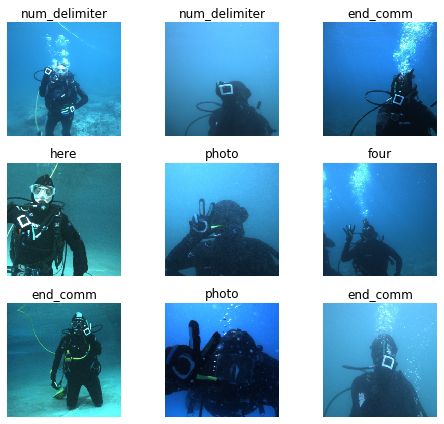

In [15]:
model_name = "resnet-50"
if model_name == "resnet-34":
    cnn_model = models.resnet34
    img_size  = 224
    epochs    = 10
    bs = 64
    # bs = 16   # uncomment this line if you run out of memory even after clicking Kernel->Restart
else:
    cnn_model = models.resnet50
    img_size  = 224
    epochs    = 10
    bs = 32
    #bs = 4   # uncomment this line if you run out of memory even after clicking Kernel->Restart

tfms = get_transforms()
data = ImageDataBunch.from_folder(split_path, bs=bs, ds_tfms=tfms, size=img_size).normalize(imagenet_stats)

data.show_batch(rows=3, figsize=(7,6))

print(f'The dataset has {len(data.classes)} ({data.c}) classes: {data.classes}')
print(f'Training   set size is: (x: {len(data.train_dl.dl.dataset.x)}, y: {len(data.train_dl.dl.dataset.y)})')
print(f'Validation set size is: (x: {len(data.valid_dl.dl.dataset.x)}, y: {len(data.valid_dl.dl.dataset.y)})')

In [16]:
print('nvidia-smi memory usage/increment:', nvidia_smi(nvidia_smi_))

learn = cnn_learner(data, cnn_model, metrics=accuracy)

print('nvidia-smi memory usage/increment:', nvidia_smi(nvidia_smi_))
print('Learner ready.')

nvidia-smi memory usage/increment: [662, 249]
nvidia-smi memory usage/increment: [718, 469]
Learner ready.


backwards torch.Size([480, 640])


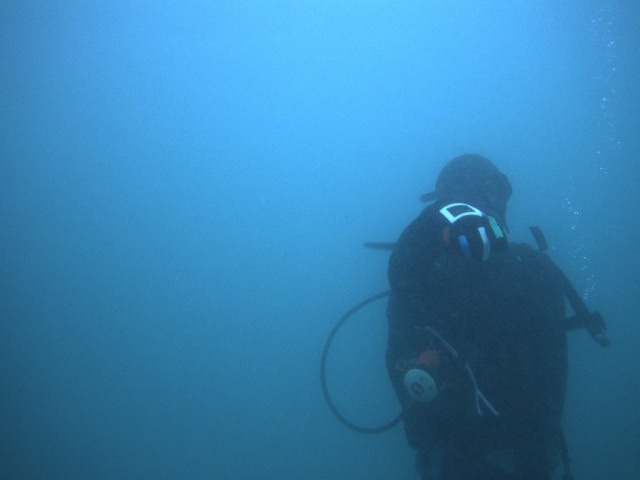

In [17]:
idx=100
img   = data.train_dl.dl.dataset.x[idx]
label = data.train_dl.dl.dataset.y[idx]
print(label, img.size)
img

backwards torch.Size([480, 640])


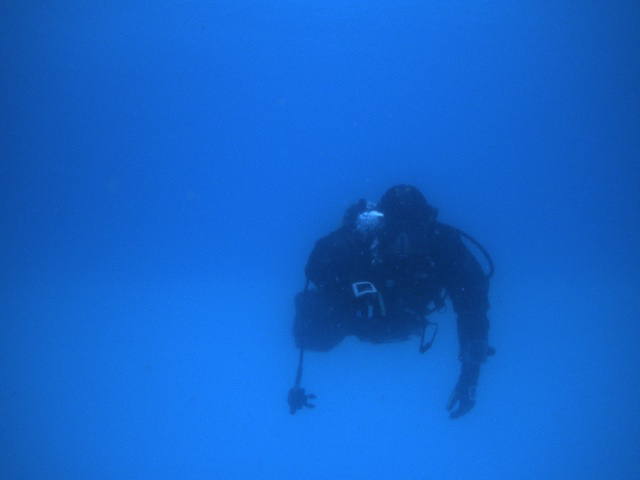

In [18]:
idx=101
img   = data.valid_dl.dl.dataset.x[idx]
label = data.valid_dl.dl.dataset.y[idx]
print(label, img.size)
img

# Training of the model with the newly created DataBunch

If you already performed these steps, go down and reload

In [19]:
learn.load(Path('/tmp/caddy-underwater-diver-classification/underwater-vision-based-gesture-recognition-notebooks-related-files/model-F') / 'resnet-50-model-F-stage-1-2019-09-16_14.21.39_9')

Learner(data=ImageDataBunch;

Train: LabelList (13267 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
backwards,backwards,backwards,backwards,backwards
Path: caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F;

Valid: LabelList (3324 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
backwards,backwards,backwards,backwards,backwards
Path: caddy-gestures-complete-v2-release-all-scenarios-fast.ai-split-model-F;

Test: None, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv

# Evaluate the model

At first, against the validation set

Plotting top losses for stage-1


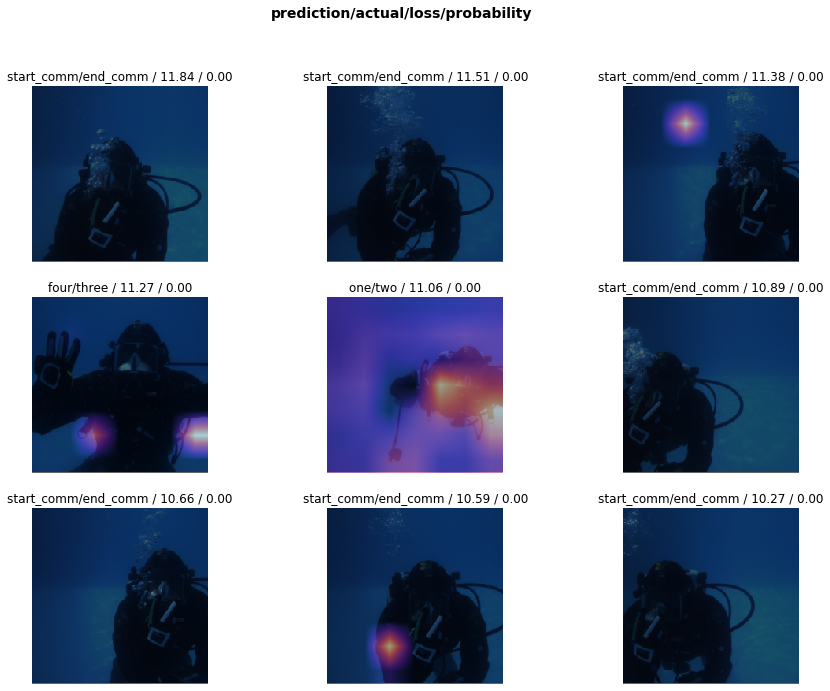

In [25]:
print('Interpreting result for stage-1')
interp = ClassificationInterpretation.from_learner(learn)
print('Plotting top losses for stage-1')
losses,idxs = interp.top_losses()
len(data.valid_ds)==len(losses)==len(idxs)
interp.plot_top_losses(9, figsize=(15,11))

Plotting confusion matrix/top confused for stage-1


[('end_comm', 'start_comm', 93),
 ('three', 'four', 59),
 ('two', 'one', 30),
 ('num_delimiter', 'end_comm', 13),
 ('num_delimiter', 'carry', 12),
 ('here', 'backwards', 9),
 ('mosaic', 'start_comm', 6),
 ('up', 'carry', 5),
 ('carry', 'up', 4),
 ('end_comm', 'carry', 3),
 ('end_comm', 'up', 3),
 ('num_delimiter', 'up', 3),
 ('one', 'two', 3),
 ('three', 'photo', 3),
 ('two', 'three', 3),
 ('down', 'one', 2),
 ('end_comm', 'num_delimiter', 2),
 ('five', 'four', 2),
 ('here', 'num_delimiter', 2),
 ('here', 'one', 2),
 ('here', 'three', 2),
 ('mosaic', 'one', 2),
 ('photo', 'one', 2),
 ('start_comm', 'num_delimiter', 2),
 ('three', 'five', 2),
 ('three', 'two', 2)]

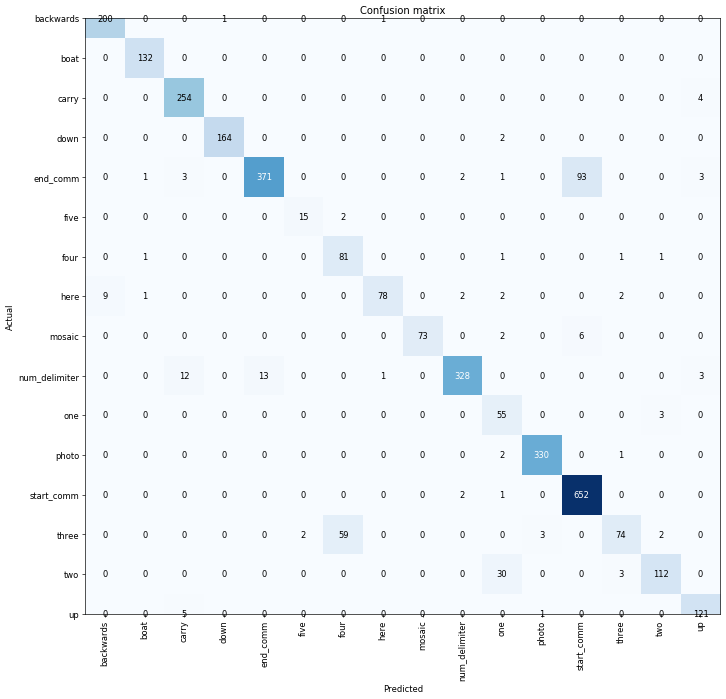

In [26]:
print('Plotting confusion matrix/top confused for stage-1')
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)
interp.most_confused(min_val=2)

# Let's also do some manual number crunching

Just because I can't find a quick way to extract accuracy inside the guts of Fast.ai after a call to **```validate()```** on the test set...

In [20]:
def evaluate_model_from_interp(interp, data):
  # perform a "manual" evaluation of the model to take a look at predictions vs. labels and to
  # re-compute accuracy from scratch (to double check and also because I didn't find a quick way
  # to extract accuracy inside the guts of Fast.ai after a call to validate() on the test set...)
  print(f'Interp has {len(interp.y_true)} ground truth labels: {interp.y_true}')
  print(f'Interp yielded {len(interp.preds)} raw predictions. First two raw predictions are: {interp.preds[:2]}')
  print(f'The problem had {len(data.classes)} classes: {data.classes}') # data.c is just len(data.classes)

  print('')
  print(f'Pred -> GroundTruth = PredLabel -> GroundTruthLabel')

  ok_pred = 0

  for idx, raw_p in enumerate(interp.preds):
      pred = np.argmax(raw_p)
      if idx < 100000:
          print(f'{pred} -> {interp.y_true[idx]} = {data.classes[pred]} -> {data.valid_ds.y[idx]}')
      if pred == interp.y_true[idx]:
          ok_pred += 1

  acc = ok_pred / len(interp.y_true)
  print(f'Overall accuracy of the model: {acc:0.5f}')
  return acc

In [21]:
evaluate_model_from_interp(interp, data)

NameError: name 'interp' is not defined

In [23]:
fnpath = Path('/mnt/btrfs-data/dataset/caddy-gestures/CADDY_gestures_complete_v2_release/all-scenarios-orig/all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/')
fn     = fnpath / 'carry/crystal-clear/carry___genova-A_03254_right.jpg'

img    = open_image(fn)
pred   = learn.predict(img)
fname  = Path(fn).stem
print(f'{fname.split("__")[0].ljust(20)} -> {pred[0]}')


carry                -> carry


In [27]:
fnlist = ['start_comm/crystal-clear/start_comm___biograd-B_00964_right.jpg', 'mosaic/cloudy-and-dark/mosaic___brodarski-C_00251_right.jpg', 'one/cloudy-and-dark/one___genova-A_03048_left.jpg', 'num_delimiter/crystal-clear/num_delimiter___genova-A_02933_right.jpg', 'two/crystal-clear/two___biograd-A_00949_left.jpg', 'num_delimiter/crystal-clear/num_delimiter___genova-A_02841_left.jpg', 'start_comm/crystal-clear/start_comm___biograd-A_01662_left.jpg', 'here/cloudy-and-dark/here___brodarski-D_00281_right.jpg', 'start_comm/cloudy-and-dark/start_comm___brodarski-A_00185_right.jpg', 'up/crystal-clear/up___genova-A_02861_left.jpg', 'two/crystal-clear/two___biograd-B_00447_left.jpg', 'num_delimiter/crystal-clear/num_delimiter___biograd-A_00955_right.jpg', 'start_comm/crystal-clear/start_comm___biograd-A_01663_left.jpg', 'mosaic/crystal-clear/mosaic___biograd-A_00938_left.jpg', 'three/crystal-clear/three___biograd-B_00584_left.jpg', 'num_delimiter/crystal-clear/num_delimiter___genova-A_02353_right.jpg', 'two/cloudy-and-dark/two___brodarski-C_00322_left.jpg', 'num_delimiter/crystal-clear/num_delimiter___biograd-B_00556_left.jpg', 'start_comm/cloudy-and-dark/start_comm___biograd-C_01149_right.jpg', 'mosaic/crystal-clear/mosaic___genova-A_02801_left.jpg', 'one/crystal-clear/one___biograd-B_00429_right.jpg', 'num_delimiter/crystal-clear/num_delimiter___biograd-B_00559_left.jpg', 'one/crystal-clear/one___biograd-A_01213_right.jpg', 'num_delimiter/cloudy-and-dark/num_delimiter___biograd-C_01031_right.jpg', 'start_comm/crystal-clear/start_comm___genova-A_03216_left.jpg', 'here/crystal-clear/here___biograd-B_00853_right.jpg', 'end_comm/crystal-clear/end_comm___genova-A_03304_left.jpg']
seq_counter = 0
for fn in fnlist:
    img     = open_image(fnpath / fn)
    rawpred = learn.predict(img)
    fname   = Path(fn).stem
    label   = fname.split("__")[0]
    pred    = str(rawpred[0])
    print(f'{str(seq_counter).ljust(4)} - {label.ljust(20)} -> {pred.ljust(20)} -> {"----- WRONG!" if label != pred else "OK"}')
    seq_counter += 1

0    - start_comm           -> start_comm           -> OK
1    - mosaic               -> mosaic               -> OK
2    - one                  -> one                  -> OK
3    - num_delimiter        -> num_delimiter        -> OK
4    - two                  -> two                  -> OK
5    - num_delimiter        -> num_delimiter        -> OK
6    - start_comm           -> start_comm           -> OK
7    - here                 -> here                 -> OK
8    - start_comm           -> start_comm           -> OK
9    - up                   -> up                   -> OK
10   - two                  -> two                  -> OK
11   - num_delimiter        -> num_delimiter        -> OK
12   - start_comm           -> start_comm           -> OK
13   - mosaic               -> mosaic               -> OK
14   - three                -> three                -> OK
15   - num_delimiter        -> num_delimiter        -> OK
16   - two                  -> two                  -> OK
17   - num_del

In [28]:
data.classes

['backwards',
 'boat',
 'carry',
 'down',
 'end_comm',
 'five',
 'four',
 'here',
 'mosaic',
 'num_delimiter',
 'one',
 'photo',
 'start_comm',
 'three',
 'two',
 'up']

In [29]:
sentences_dir = Path('/tmp/caddy-underwater-diver-classification/underwater-vision-based-gesture-recognition-notebooks-related-files/caddian-generator')

In [30]:
output_image_seq_fn = sentences_dir / 'output-image-sequences.pkl'
with open(str(output_image_seq_fn), 'rb') as fp:
    output_image_seq = pickle.load(fp)

total_sentences = len(output_image_seq)
print(f'Total_sentences: {total_sentences}')

Total_sentences: 1000


In [32]:
print(len(output_image_seq[0]), output_image_seq[0])
print(len(output_image_seq[17]), output_image_seq[17])
print(len(output_image_seq[987]), output_image_seq[987])

3 [PosixPath('/mnt/btrfs-data/dataset/caddy-gestures/CADDY_gestures_complete_v2_release/all-scenarios-orig/all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___genova-A_03218_right.jpg'), PosixPath('/mnt/btrfs-data/dataset/caddy-gestures/CADDY_gestures_complete_v2_release/all-scenarios-orig/all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/carry/cloudy-and-dark/carry___biograd-C_01799_right.jpg'), PosixPath('/mnt/btrfs-data/dataset/caddy-gestures/CADDY_gestures_complete_v2_release/all-scenarios-orig/all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/end_comm/cloudy-and-dark/end_comm___biograd-C_01221_right.jpg')]
7 [PosixPath('/mnt/btrfs-data/dataset/caddy-gestures/CADDY_gestures_complete_v2_release/all-scenarios-orig/all-scenarios-split-cristal-clear-vs-cloudy-and-dark/all-scenarios/start_comm/crystal-clear/start_comm___biograd-A_01666_right.jpg'), PosixPath('/mnt/btrfs-data/dataset/caddy-gestures/CAD

In [34]:
seq_counter        = 0
confused_sentences = 0
confused_symbols   = 0
total_symbols      = 0

for seq in output_image_seq:
    is_confused = False
    '''
    if seq_counter > 10:
        break
    '''
    for fn in seq:
        img     = open_image(fnpath / fn)
        rawpred = learn.predict(img)
        fname   = Path(fn).stem
        label   = fname.split("__")[0]
        pred    = str(rawpred[0])

        if seq_counter < 1 or label != pred:
            print(f'{str(seq_counter).ljust(4)} - {label.ljust(20)} -> {pred.ljust(20)} -> {"----- WRONG!" if label != pred else "OK"}')
        
        if label != pred:
            confused_symbols += 1
            is_confused = True
            
        total_symbols += 1
    seq_counter += 1
    if is_confused:
        confused_sentences += 1

print(f'Confused symbols: {confused_symbols} out of total symbols: {total_symbols}')
print(f'Confused sentences: {confused_sentences} out of total sentences: {total_sentences}')

0    - start_comm           -> start_comm           -> OK
0    - carry                -> carry                -> OK
0    - end_comm             -> end_comm             -> OK
5    - start_comm           -> one                  -> ----- WRONG!
5    - three                -> start_comm           -> ----- WRONG!
10   - mosaic               -> start_comm           -> ----- WRONG!
11   - num_delimiter        -> photo                -> ----- WRONG!
12   - three                -> start_comm           -> ----- WRONG!
18   - two                  -> one                  -> ----- WRONG!
20   - mosaic               -> start_comm           -> ----- WRONG!
20   - two                  -> three                -> ----- WRONG!
20   - num_delimiter        -> end_comm             -> ----- WRONG!
20   - start_comm           -> one                  -> ----- WRONG!
21   - num_delimiter        -> end_comm             -> ----- WRONG!
26   - three                -> four                 -> ----- WRONG!
35   - sta

398  - mosaic               -> start_comm           -> ----- WRONG!
398  - two                  -> one                  -> ----- WRONG!
398  - up                   -> one                  -> ----- WRONG!
403  - two                  -> one                  -> ----- WRONG!
405  - two                  -> one                  -> ----- WRONG!
407  - start_comm           -> one                  -> ----- WRONG!
413  - num_delimiter        -> photo                -> ----- WRONG!
416  - three                -> four                 -> ----- WRONG!
416  - two                  -> three                -> ----- WRONG!
417  - start_comm           -> one                  -> ----- WRONG!
421  - two                  -> three                -> ----- WRONG!
421  - num_delimiter        -> carry                -> ----- WRONG!
422  - here                 -> backwards            -> ----- WRONG!
427  - num_delimiter        -> end_comm             -> ----- WRONG!
428  - start_comm           -> one              

753  - down                 -> one                  -> ----- WRONG!
754  - mosaic               -> start_comm           -> ----- WRONG!
754  - two                  -> three                -> ----- WRONG!
755  - here                 -> backwards            -> ----- WRONG!
757  - down                 -> one                  -> ----- WRONG!
762  - two                  -> three                -> ----- WRONG!
764  - start_comm           -> one                  -> ----- WRONG!
767  - mosaic               -> one                  -> ----- WRONG!
768  - num_delimiter        -> carry                -> ----- WRONG!
773  - up                   -> one                  -> ----- WRONG!
776  - here                 -> backwards            -> ----- WRONG!
779  - down                 -> one                  -> ----- WRONG!
782  - end_comm             -> start_comm           -> ----- WRONG!
784  - mosaic               -> start_comm           -> ----- WRONG!
784  - two                  -> three            

# Fast.ai doesn't provide an `evaluate()`-like function as in Keras

![alt text](https://i.ibb.co/86k8rFN/image.png)

So it's not possible to have a labeled test set in the same databunch used for training/validation of the model. Ok, let's follow the advice and build another databunch with training and test set (used as validation set). <spoiler> In Keras there's a handy [model.evaluate()](https://keras.io/models/model/#evaluate) function to test the model. </spoiler>

In [37]:
print('Interpreting result for stage-1 (test set)')
interp = ClassificationInterpretation.from_learner(learn)
print('Plotting top losses for stage-1 (test set)')
losses,idxs = interp.top_losses()
len(data_test['overall'].valid_ds)==len(losses)==len(idxs)
interp.plot_top_losses(9, figsize=(15,11))

Plotting top losses for stage-1 (test set)


NameError: name 'data_test' is not defined

Plotting confusion matrix/top confused for stage-1


[('end_comm', 'start_comm', 93),
 ('three', 'four', 59),
 ('two', 'one', 30),
 ('num_delimiter', 'end_comm', 13),
 ('num_delimiter', 'carry', 12),
 ('here', 'backwards', 9),
 ('mosaic', 'start_comm', 6),
 ('up', 'carry', 5),
 ('carry', 'up', 4),
 ('end_comm', 'carry', 3),
 ('end_comm', 'up', 3),
 ('num_delimiter', 'up', 3),
 ('one', 'two', 3),
 ('three', 'photo', 3),
 ('two', 'three', 3),
 ('down', 'one', 2),
 ('end_comm', 'num_delimiter', 2),
 ('five', 'four', 2),
 ('here', 'num_delimiter', 2),
 ('here', 'one', 2),
 ('here', 'three', 2),
 ('mosaic', 'one', 2),
 ('photo', 'one', 2),
 ('start_comm', 'num_delimiter', 2),
 ('three', 'five', 2),
 ('three', 'two', 2)]

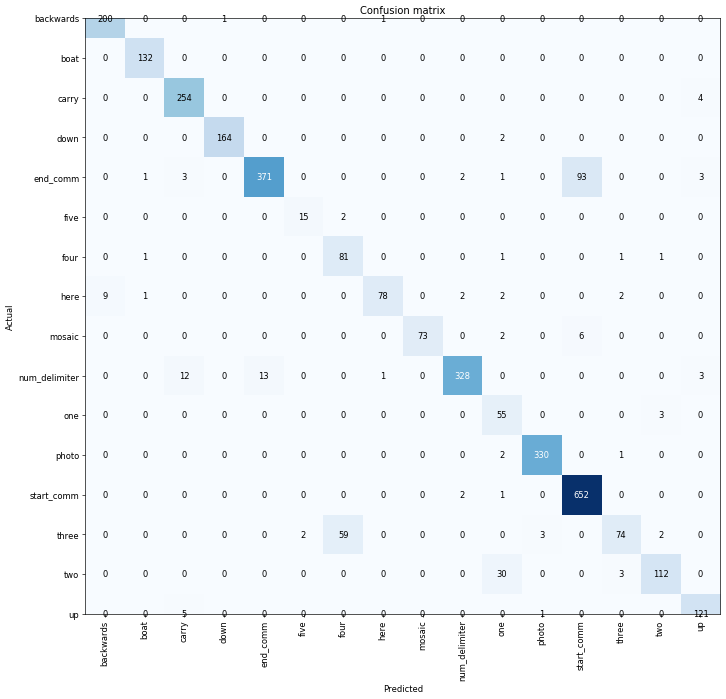

In [38]:
print('Plotting confusion matrix/top confused for stage-1')
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)
interp.most_confused(min_val=2)

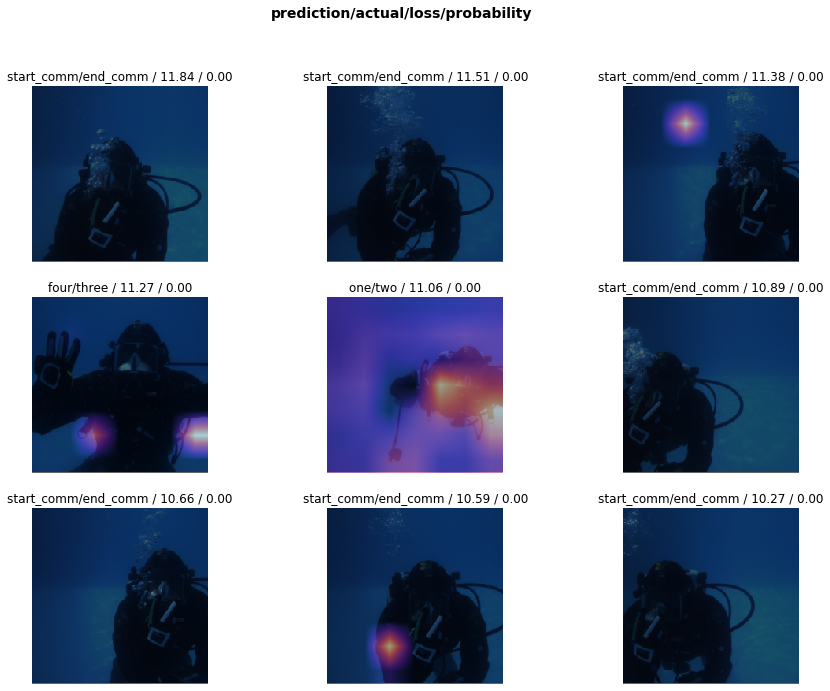

In [39]:
interp.plot_top_losses(9, figsize=(15,11), heatmap=True)

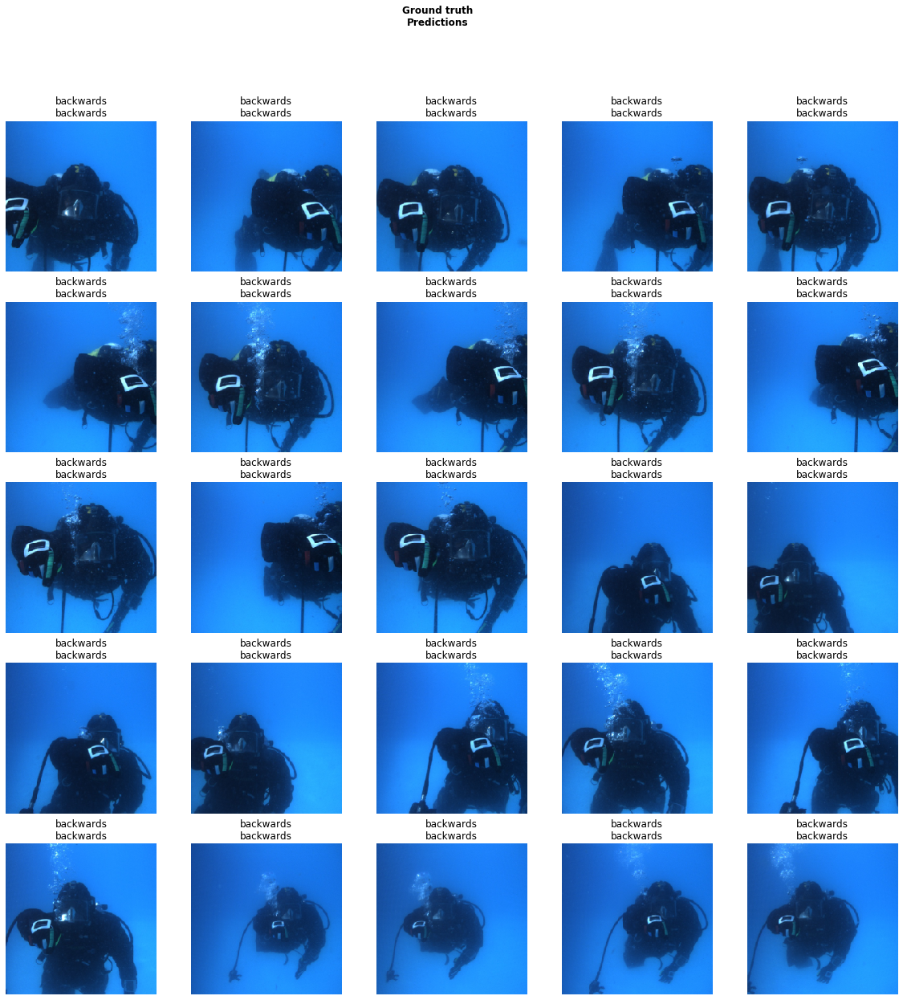

In [40]:
learn.show_results()

In [41]:
evaluate_model_from_interp(interp, data)

Interp has 3324 ground truth labels: tensor([ 0,  0,  0,  ..., 15, 15, 15])
Interp yielded 3324 raw predictions. First two raw predictions are: tensor([[9.9781e-01, 7.6478e-06, 2.5506e-05, 5.4062e-05, 5.8022e-06, 9.6961e-07,
         1.1931e-05, 1.5044e-03, 2.6110e-07, 3.1376e-06, 1.5424e-04, 6.9205e-06,
         8.9569e-06, 8.3460e-05, 2.4237e-04, 7.9445e-05],
        [9.9998e-01, 1.3136e-06, 7.3266e-08, 2.7722e-08, 2.9217e-08, 9.0516e-10,
         1.4820e-08, 1.5703e-05, 2.2434e-09, 1.1961e-07, 4.3855e-07, 1.3278e-08,
         1.1954e-08, 1.5775e-08, 8.2783e-08, 2.2547e-07]])
The problem had 16 classes: ['backwards', 'boat', 'carry', 'down', 'end_comm', 'five', 'four', 'here', 'mosaic', 'num_delimiter', 'one', 'photo', 'start_comm', 'three', 'two', 'up']

Pred -> GroundTruth = PredLabel -> GroundTruthLabel
0 -> 0 = backwards -> backwards
0 -> 0 = backwards -> backwards
0 -> 0 = backwards -> backwards
0 -> 0 = backwards -> backwards
0 -> 0 = backwards -> backwards
0 -> 0 = backwards -

4 -> 4 = end_comm -> end_comm
4 -> 4 = end_comm -> end_comm
4 -> 4 = end_comm -> end_comm
4 -> 4 = end_comm -> end_comm
4 -> 4 = end_comm -> end_comm
4 -> 4 = end_comm -> end_comm
4 -> 4 = end_comm -> end_comm
4 -> 4 = end_comm -> end_comm
4 -> 4 = end_comm -> end_comm
4 -> 4 = end_comm -> end_comm
4 -> 4 = end_comm -> end_comm
4 -> 4 = end_comm -> end_comm
4 -> 4 = end_comm -> end_comm
4 -> 4 = end_comm -> end_comm
4 -> 4 = end_comm -> end_comm
4 -> 4 = end_comm -> end_comm
4 -> 4 = end_comm -> end_comm
4 -> 4 = end_comm -> end_comm
4 -> 4 = end_comm -> end_comm
4 -> 4 = end_comm -> end_comm
4 -> 4 = end_comm -> end_comm
4 -> 4 = end_comm -> end_comm
4 -> 4 = end_comm -> end_comm
4 -> 4 = end_comm -> end_comm
4 -> 4 = end_comm -> end_comm
4 -> 4 = end_comm -> end_comm
4 -> 4 = end_comm -> end_comm
4 -> 4 = end_comm -> end_comm
4 -> 4 = end_comm -> end_comm
12 -> 4 = start_comm -> end_comm
4 -> 4 = end_comm -> end_comm
4 -> 4 = end_comm -> end_comm
4 -> 4 = end_comm -> end_comm
4 -> 4 

11 -> 11 = photo -> photo
11 -> 11 = photo -> photo
11 -> 11 = photo -> photo
11 -> 11 = photo -> photo
11 -> 11 = photo -> photo
11 -> 11 = photo -> photo
11 -> 11 = photo -> photo
11 -> 11 = photo -> photo
11 -> 11 = photo -> photo
11 -> 11 = photo -> photo
11 -> 11 = photo -> photo
11 -> 11 = photo -> photo
11 -> 11 = photo -> photo
11 -> 11 = photo -> photo
11 -> 11 = photo -> photo
11 -> 11 = photo -> photo
11 -> 11 = photo -> photo
11 -> 11 = photo -> photo
11 -> 11 = photo -> photo
11 -> 11 = photo -> photo
11 -> 11 = photo -> photo
11 -> 11 = photo -> photo
13 -> 11 = three -> photo
11 -> 11 = photo -> photo
11 -> 11 = photo -> photo
11 -> 11 = photo -> photo
11 -> 11 = photo -> photo
11 -> 11 = photo -> photo
11 -> 11 = photo -> photo
11 -> 11 = photo -> photo
11 -> 11 = photo -> photo
11 -> 11 = photo -> photo
11 -> 11 = photo -> photo
11 -> 11 = photo -> photo
11 -> 11 = photo -> photo
11 -> 11 = photo -> photo
11 -> 11 = photo -> photo
11 -> 11 = photo -> photo
11 -> 11 = p

12 -> 12 = start_comm -> start_comm
12 -> 12 = start_comm -> start_comm
12 -> 12 = start_comm -> start_comm
12 -> 12 = start_comm -> start_comm
12 -> 12 = start_comm -> start_comm
12 -> 12 = start_comm -> start_comm
12 -> 12 = start_comm -> start_comm
12 -> 12 = start_comm -> start_comm
12 -> 12 = start_comm -> start_comm
12 -> 12 = start_comm -> start_comm
12 -> 12 = start_comm -> start_comm
12 -> 12 = start_comm -> start_comm
12 -> 12 = start_comm -> start_comm
12 -> 12 = start_comm -> start_comm
12 -> 12 = start_comm -> start_comm
12 -> 12 = start_comm -> start_comm
12 -> 12 = start_comm -> start_comm
12 -> 12 = start_comm -> start_comm
12 -> 12 = start_comm -> start_comm
12 -> 12 = start_comm -> start_comm
12 -> 12 = start_comm -> start_comm
12 -> 12 = start_comm -> start_comm
12 -> 12 = start_comm -> start_comm
12 -> 12 = start_comm -> start_comm
12 -> 12 = start_comm -> start_comm
12 -> 12 = start_comm -> start_comm
12 -> 12 = start_comm -> start_comm
12 -> 12 = start_comm -> sta

0.914560770156438